In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d
import sklearn
from sklearn.preprocessing import StandardScaler
from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [3]:
# defining the path
path = r'C:\users\localadmin\Machine Learning\Data Sets'

In [5]:
#Importing climate data as df
df = pd.read_csv(os.path.join(path, 'Processed Data', '[DATASET]_scaled.csv'))

In [7]:
df.head()

,Unnamed: 0,id,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,1,1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,2,2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,3,3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,4,4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


In [9]:
df = df.drop(columns=['Unnamed: 0', 'id'])

In [11]:
df.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


In [13]:
df['DATE'].max()

20221031

In [15]:
df['DATE'].min()

19600101

In [17]:
pd.set_option('display.max_columns', None)

In [19]:
### 2. look at a weather stations (BASEL)
df1 = df[['DATE', 'MONTH','BASEL_cloud_cover','BASEL_wind_speed','BASEL_humidity','BASEL_pressure',
    'BASEL_global_radiation','BASEL_precipitation','BASEL_snow_depth','BASEL_sunshine',
    'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min','BASEL_temp_max']].copy()

In [21]:
df1

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,-0.902918,-0.528623,-0.845652,-0.478356
1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,-0.810126,-0.582946,-0.462450,-0.569988
2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,-1.065304,-0.257010,-0.186545,-0.592896
3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,-0.114186,-0.555784,-0.385810,-0.512718
4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,0.187388,-1.003946,-1.075573,-1.039603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,0.720943,0.747959,0.779123,0.724314
22946,20221028,10,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,0.187388,0.856604,1.223637,0.781585
22947,20221029,10,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,0.349774,0.856604,1.039701,0.838855
22948,20221030,10,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,0.280180,0.680055,0.809780,0.689952


In [23]:
# Drop the DATE and MONTH data as those numbers are not scaled with the rest
notemp = df1.drop(['DATE', 'MONTH'], axis = 1)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(1, 0, 'BASEL_cloud_cover'),
  Text(2, 0, 'BASEL_wind_speed'),
  Text(3, 0, 'BASEL_humidity'),
  Text(4, 0, 'BASEL_pressure'),
  Text(5, 0, 'BASEL_global_radiation'),
  Text(6, 0, 'BASEL_precipitation'),
  Text(7, 0, 'BASEL_snow_depth'),
  Text(8, 0, 'BASEL_sunshine'),
  Text(9, 0, 'BASEL_sunshine'),
  Text(10, 0, 'BASEL_temp_mean'),
  Text(11, 0, 'BASEL_temp_min'),
  Text(12, 0, 'BASEL_temp_max')])

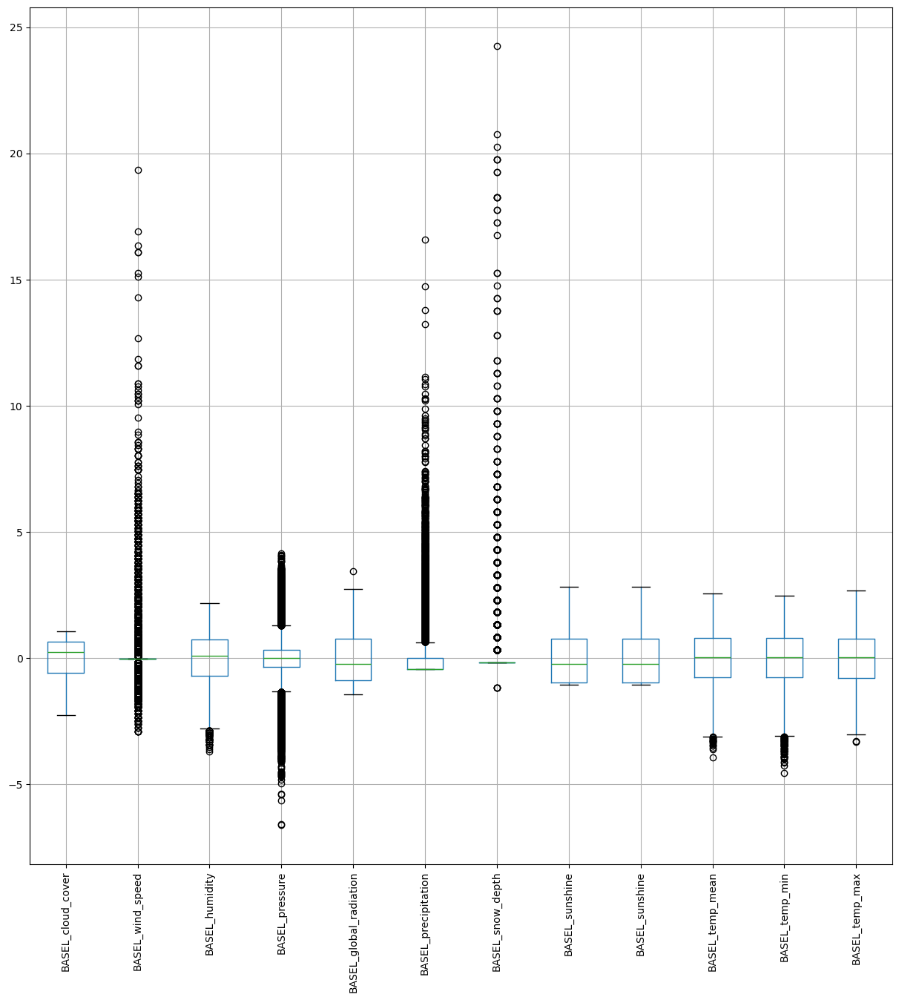

In [25]:
#Look at a whisker plot of the data to see variations in temperatures\n",
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

In [27]:
#Reduce your dataset to a single year
dfyear = df1[df1['DATE'].astype(str).str.contains('1962')]
dfyear

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
731,19620101,1,1.076130,-0.02793,1.910140,-0.001949,-1.251420,5.165884,-0.179228,-1.065304,-1.065304,-1.316301,-1.044917,-0.833430
732,19620102,1,1.076130,-0.02793,2.000476,-0.001949,-1.251420,-0.245107,20.257548,-1.065304,-1.065304,-1.655817,-1.382134,-1.749751
733,19620103,1,1.076130,-0.02793,2.090813,-0.001949,-1.251420,-0.205026,19.260632,-1.065304,-1.065304,-2.131140,-2.117882,-1.944469
734,19620104,1,0.244897,-0.02793,1.819803,-0.001949,-1.251420,-0.445514,17.765258,-1.065304,-1.065304,-1.764463,-1.933945,-1.726843
735,19620105,1,1.076130,-0.02793,2.181150,-0.001949,-1.251420,-0.445514,16.768342,-1.065304,-1.065304,-1.560753,-1.397462,-1.761205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,19621227,12,-1.001953,-0.02793,1.097107,-0.001949,-0.961452,-0.445514,0.319230,-0.531750,-0.531750,-3.204012,-3.267487,-2.814974
1092,19621228,12,-1.001953,-0.02793,0.645423,-0.001949,-0.725182,0.576562,0.319230,0.442567,0.442567,-2.443495,-3.451424,-2.299543
1093,19621229,12,1.076130,-0.02793,1.548792,-0.001949,-1.251420,-0.084781,3.808436,-1.065304,-1.065304,-2.171882,-2.041241,-2.093371
1094,19621230,12,1.076130,-0.02793,1.548792,-0.001949,-1.251420,0.295992,3.808436,-1.065304,-1.065304,-1.506430,-2.179194,-1.245775


In [29]:
dfyear.describe()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
count,3.650000e+02,365.000000,365.000000,3.650000e+02,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1.962067e+07,6.526027,-0.176413,-2.793014e-02,-0.188647,-1.948634e-03,0.116681,-0.108501,0.286455,0.096503,0.096503,-0.227988,-0.327605,-0.082926
std,3.454755e+02,3.452584,1.125832,1.806589e-16,1.022673,1.194259e-17,1.077963,0.799542,2.440596,1.034925,1.034925,1.098855,1.067577,1.120417
min,1.962010e+07,1.000000,-2.248803,-2.793014e-02,-2.606706,-1.948634e-03,-1.262159,-0.445514,-0.179228,-1.065304,-1.065304,-3.204012,-3.451424,-2.837882
25%,1.962040e+07,4.000000,-1.001953,-2.793014e-02,-0.980642,-1.948634e-03,-0.875535,-0.445514,-0.179228,-0.949314,-0.949314,-1.139752,-1.044917,-0.936517
50%,1.962070e+07,7.000000,0.244897,-2.793014e-02,-0.257946,-1.948634e-03,-0.070069,-0.445514,-0.179228,-0.044592,-0.044592,-0.270591,-0.370482,-0.066012
75%,1.962100e+07,10.000000,1.076130,-2.793014e-02,0.645423,-1.948634e-03,1.014626,-0.164944,-0.179228,0.883329,0.883329,0.693636,0.533874,0.850309
max,1.962123e+07,12.000000,1.076130,-2.793014e-02,2.181150,-1.948634e-03,2.421507,5.165884,20.257548,2.368002,2.368002,2.078863,1.729464,2.408054


In [31]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

In [33]:
notempyear

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
731,1.076130,-0.02793,1.910140,-0.001949,-1.251420,5.165884,-0.179228,-1.065304,-1.065304,-1.316301,-1.044917,-0.833430
732,1.076130,-0.02793,2.000476,-0.001949,-1.251420,-0.245107,20.257548,-1.065304,-1.065304,-1.655817,-1.382134,-1.749751
733,1.076130,-0.02793,2.090813,-0.001949,-1.251420,-0.205026,19.260632,-1.065304,-1.065304,-2.131140,-2.117882,-1.944469
734,0.244897,-0.02793,1.819803,-0.001949,-1.251420,-0.445514,17.765258,-1.065304,-1.065304,-1.764463,-1.933945,-1.726843
735,1.076130,-0.02793,2.181150,-0.001949,-1.251420,-0.445514,16.768342,-1.065304,-1.065304,-1.560753,-1.397462,-1.761205
...,...,...,...,...,...,...,...,...,...,...,...,...
1091,-1.001953,-0.02793,1.097107,-0.001949,-0.961452,-0.445514,0.319230,-0.531750,-0.531750,-3.204012,-3.267487,-2.814974
1092,-1.001953,-0.02793,0.645423,-0.001949,-0.725182,0.576562,0.319230,0.442567,0.442567,-2.443495,-3.451424,-2.299543
1093,1.076130,-0.02793,1.548792,-0.001949,-1.251420,-0.084781,3.808436,-1.065304,-1.065304,-2.171882,-2.041241,-2.093371
1094,1.076130,-0.02793,1.548792,-0.001949,-1.251420,0.295992,3.808436,-1.065304,-1.065304,-1.506430,-2.179194,-1.245775


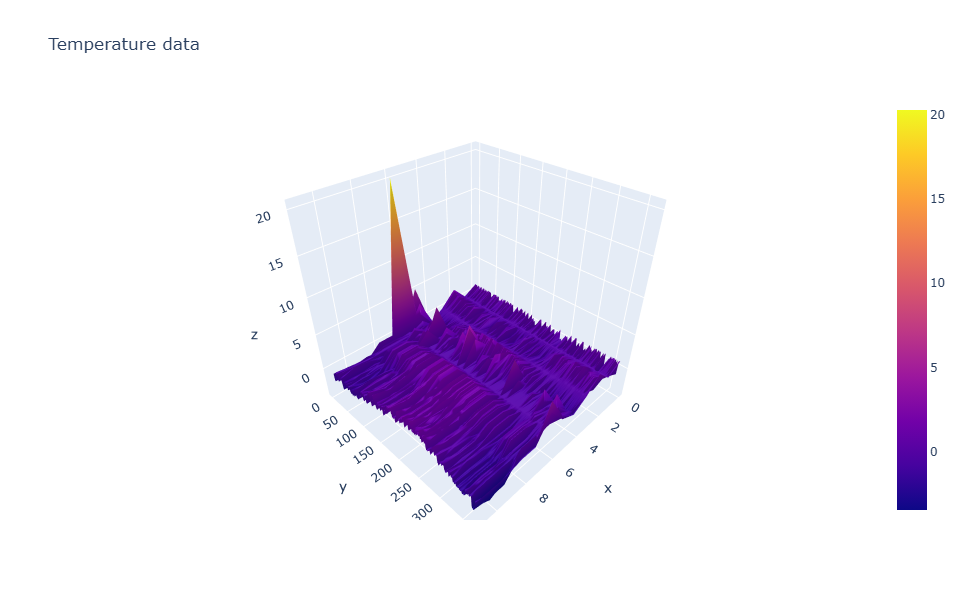

In [35]:
fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperature data ', autosize=False,
width=600, height=600)
fig.show()

In [37]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [39]:
n_rows = dfyear.shape[0]
n_rows

365

In [41]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1)

In [43]:
print(X.shape, y.shape)

(365, 2) (365, 1)


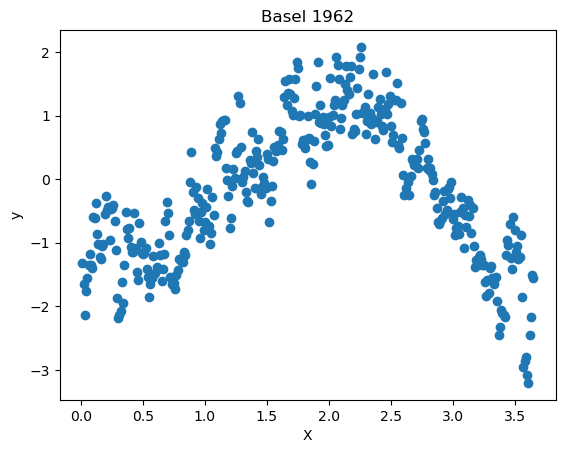

In [45]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['BASEL_temp_mean'])
plt.xlabel('X'); plt.ylabel('y')
plt.title('Basel 1962')
plt.show()

In [47]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear['BASEL_temp_mean'].min()

-3.2040120998121213

In [49]:
dfyear['BASEL_temp_mean'].max()

2.078862799472186

In [51]:
# This computes the loss function for the gradiant descent. DO NOT CHANGE!
def compute_cost(X, y, theta=np.array([[0], [0]])):
    """Compute the loss function for gradient descent.

    Args:
        X (np.ndarray): Covariate matrix (features).
        y (np.ndarray): Prediction results (target values).
        theta (np.ndarray): Coefficients for the model, initialized to zeros.

    Returns:
        float: The computed loss value.
    """
    
    m = len(y)  # Number of samples

    # Reshape theta to ensure it's the correct shape for dot product
    theta = theta.reshape(2, 1)
    
    # Calculate the hypothesis (predicted values)
    h_x = np.dot(X, theta)
    
    # Calculate the error term: squared differences
    error_term = np.sum((h_x - y) ** 2)
    
    # Compute the loss: average of the squared errors divided by 2m
    loss = error_term / (2 * m)
    
    return loss

In [53]:
compute_cost(X,y)

0.6280768140890555

In [55]:
import numpy as np

def gradient_descent(X, y, theta=np.array([[0], [0]]), alpha=0.01, num_iterations=1500):
    """Solve for theta using the Gradient Descent optimization technique.

    Args:
        X (np.ndarray): Covariate matrix (features).
        y (np.ndarray): Prediction results (target values).
        theta (np.ndarray): Initial coefficients for the model.
        alpha (float): Learning rate.
        num_iterations (int): Number of iterations for gradient descent.

    Returns:
        tuple: Updated theta values, history of cost function, and histories of theta values.
    """
    
    m = len(y)  # Number of samples
    J_history = []        # To record the cost at each iteration
    theta0_history = []   # To record theta0 values
    theta1_history = []   # To record theta1 values
    theta = theta.astype(float).reshape(2, 1)  # Ensure theta is float type and has the correct shape
    
    for i in range(num_iterations):
        # Compute error
        error = np.dot(X, theta) - y
        
        # Calculate the gradient
        term0 = (alpha / m) * np.sum(error * X[:, 0].reshape(m, 1))
        term1 = (alpha / m) * np.sum(error * X[:, 1].reshape(m, 1))
        
        # Update theta
        theta -= np.array([[term0], [term1]], dtype=float)  # Ensure term_vector is float
        
        # Store history values
        theta0_history.append(theta[0, 0])
        theta1_history.append(theta[1, 0])
        J_history.append(compute_cost(X, y, theta))
    
    return theta, J_history, theta0_history, theta1_history

In [57]:
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'\n",
#You will need to adjust these numbers
# Configuration for Gradient Descent

# Number of iterations for gradient descent. Start small and increase as needed.
num_iterations = 500  

# Initial guess for theta values. You can start with [1, 1] or [0, 0].
theta_init = np.array([[0], [0]])

# Learning rate (step size). Experiment with values between 0.1 and 0.00001.
# If the solution is not converging, consider trying a smaller value.
alpha = 0.05  

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

In [59]:
theta

array([[-0.36024104],
       [ 0.07245748]])

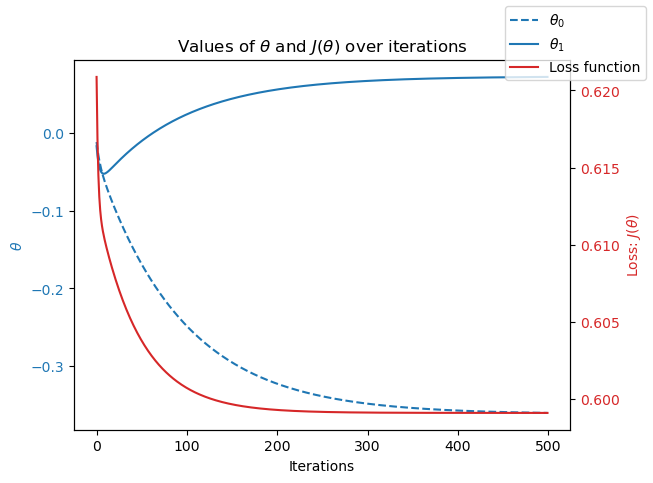

In [67]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# Plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set labels and tick parameters for the first y-axis
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Add legends
fig.legend()

# Display the plot with the legend
plt.show()

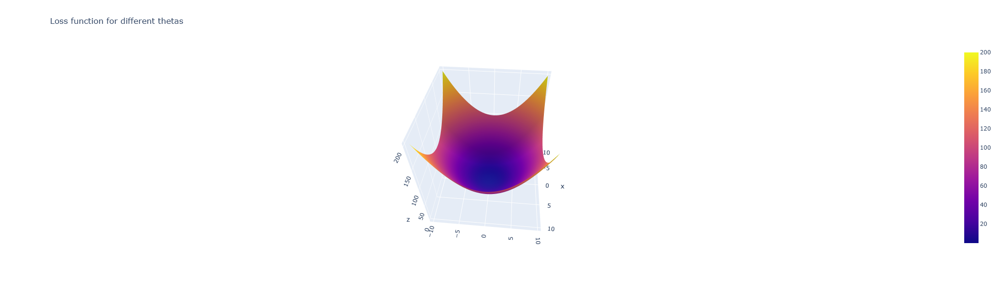

In [73]:
# Example ranges for theta0 and theta1 (you can adjust these)
theta0_vals = np.linspace(-10, 10, 100)  # Range of theta0 values
theta1_vals = np.linspace(-10, 10, 100)  # Range of theta1 values

# Create a meshgrid of theta0 and theta1 values
theta0_grid, theta1_grid = np.meshgrid(theta0_vals, theta1_vals)

# Example loss function: J(theta0, theta1) = (theta0^2 + theta1^2) (replace this with your actual loss function)
J_vals = theta0_grid**2 + theta1_grid**2  # This is just an example; replace with your actual loss function

# This figure shows the loss function.
# X = Theta0
# Y = Theta1
# Z = Loss
# Find where it is closest to 0 in X and Y!

# You can click/hold in the graph below to rotate!

# Create a surface plot for the loss function
fig = go.Figure(data=[go.Surface(x=theta1_grid, y=theta0_grid, z=J_vals)])

# Update the layout for the figure
fig.update_layout(
    title='Loss function for different thetas',  # Title of the plot
    autosize=True,                               # Auto-resize the plot
    width=600,                                   # Width of the figure
    height=600,                                  # Height of the figure
    xaxis_title='theta0',                        # Label for X-axis
    yaxis_title='theta1'                         # Label for Y-axis
)

# Show the figure
fig.show()

In [75]:
#2. look at a year of temperature data for one of the weather stations (BASEL 1990)
df2 = df[['DATE', 'MONTH','BASEL_cloud_cover','BASEL_wind_speed','BASEL_humidity','BASEL_pressure',
    'BASEL_global_radiation','BASEL_precipitation','BASEL_snow_depth','BASEL_sunshine',
    'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min','BASEL_temp_max']].copy()

In [77]:
# Drop the DATE and MONTH data as those numbers are not scaled with the rest
notemp2 = df2.drop(['DATE', 'MONTH'], axis = 1)

In [79]:
notemp2

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,-0.902918,-0.528623,-0.845652,-0.478356
1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,-0.810126,-0.582946,-0.462450,-0.569988
2,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,-1.065304,-0.257010,-0.186545,-0.592896
3,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,-0.114186,-0.555784,-0.385810,-0.512718
4,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,0.187388,-1.003946,-1.075573,-1.039603
...,...,...,...,...,...,...,...,...,...,...,...,...
22945,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,0.720943,0.747959,0.779123,0.724314
22946,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,0.187388,0.856604,1.223637,0.781585
22947,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,0.349774,0.856604,1.039701,0.838855
22948,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,0.280180,0.680055,0.809780,0.689952


In [81]:
#Reduce your dataset to a single year\n",
dfyear2 = df2[df2['DATE'].astype(str).str.contains('1990')]
dfyear2

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
10958,19900101,1,-2.248803,-0.027930,0.645423,0.563561,-0.800359,-0.445514,-0.179228,0.604953,0.604953,-1.696559,-1.520087,-1.589395
10959,19900102,1,-1.417570,-0.027930,0.735760,0.884527,-0.929233,-0.445514,-0.179228,-0.531750,-0.531750,-1.655817,-1.566071,-1.532125
10960,19900103,1,1.076130,-0.027930,1.187444,0.777538,-1.229941,-0.445514,-0.179228,-1.065304,-1.065304,-1.710140,-1.612055,-1.681027
10961,19900104,1,-1.417570,-0.027930,0.103401,1.297196,-0.864796,-0.445514,-0.179228,0.233784,0.233784,-1.506430,-1.443447,-1.474855
10962,19900105,1,0.660514,-0.027930,0.464749,1.618161,-1.197722,-0.365351,-0.179228,-1.018908,-1.018908,-1.411366,-1.443447,-1.429039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,19901227,12,0.660514,5.705005,-0.348283,-0.949560,-1.079587,-0.205026,-0.179228,-0.694136,-0.694136,-0.515042,-0.692371,-0.524172
11319,19901228,12,-1.001953,0.791061,-0.438620,0.471857,-0.800359,-0.405433,-0.179228,0.465765,0.465765,-0.895301,-0.723027,-0.936517
11320,19901229,12,0.660514,3.794027,-0.528957,-0.261778,-1.272899,0.576562,-0.179228,-1.042106,-1.042106,-0.012558,-0.370482,0.094344
11321,19901230,12,1.076130,1.337054,-0.167609,0.624698,-1.315857,0.576562,-0.179228,-1.065304,-1.065304,0.218313,0.303953,0.048528


In [83]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest
notempyear2 = dfyear2.drop(['DATE','MONTH'], axis=1)

In [85]:
notempyear2

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
10958,-2.248803,-0.027930,0.645423,0.563561,-0.800359,-0.445514,-0.179228,0.604953,0.604953,-1.696559,-1.520087,-1.589395
10959,-1.417570,-0.027930,0.735760,0.884527,-0.929233,-0.445514,-0.179228,-0.531750,-0.531750,-1.655817,-1.566071,-1.532125
10960,1.076130,-0.027930,1.187444,0.777538,-1.229941,-0.445514,-0.179228,-1.065304,-1.065304,-1.710140,-1.612055,-1.681027
10961,-1.417570,-0.027930,0.103401,1.297196,-0.864796,-0.445514,-0.179228,0.233784,0.233784,-1.506430,-1.443447,-1.474855
10962,0.660514,-0.027930,0.464749,1.618161,-1.197722,-0.365351,-0.179228,-1.018908,-1.018908,-1.411366,-1.443447,-1.429039
...,...,...,...,...,...,...,...,...,...,...,...,...
11318,0.660514,5.705005,-0.348283,-0.949560,-1.079587,-0.205026,-0.179228,-0.694136,-0.694136,-0.515042,-0.692371,-0.524172
11319,-1.001953,0.791061,-0.438620,0.471857,-0.800359,-0.405433,-0.179228,0.465765,0.465765,-0.895301,-0.723027,-0.936517
11320,0.660514,3.794027,-0.528957,-0.261778,-1.272899,0.576562,-0.179228,-1.042106,-1.042106,-0.012558,-0.370482,0.094344
11321,1.076130,1.337054,-0.167609,0.624698,-1.315857,0.576562,-0.179228,-1.065304,-1.065304,0.218313,0.303953,0.048528


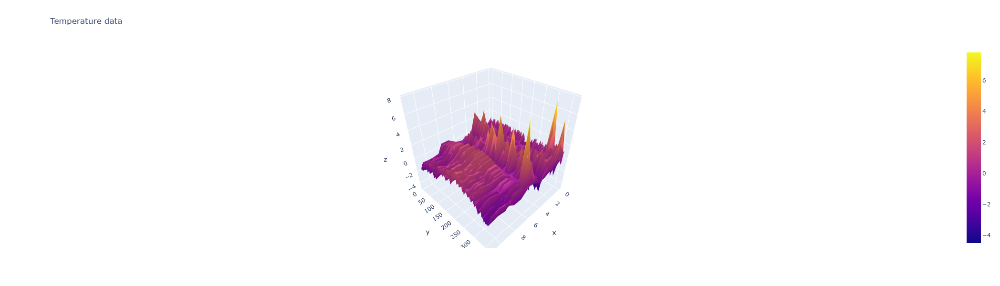

In [87]:
fig = go.Figure(data=[go.Surface(z=notempyear2.values)])
fig.update_layout(title='Temperature data ', autosize=False,
width=600, height=600)
fig.show()

In [89]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)\n",
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [91]:
n_rows2 = dfyear2.shape[0]
n_rows2

365

In [93]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear2['BASEL_temp_mean'].to_numpy().reshape(n_rows,1)

In [95]:
X.shape, y.shape

((365, 2), (365, 1))

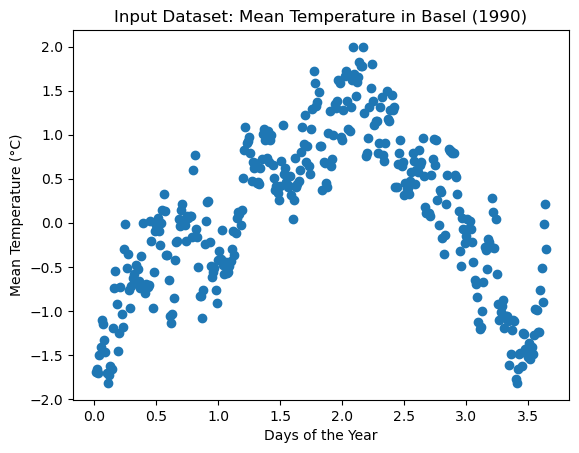

In [97]:
# Assuming index and dfyear2 are defined correctly
plt.scatter(x=index['index'], y=dfyear2['BASEL_temp_mean'])
plt.xlabel('Days of the Year')  # Optional: Replace 'X' with a more descriptive label
plt.ylabel('Mean Temperature (°C)');  # Optional: Specify units
plt.title('Input Dataset: Mean Temperature in Basel (1990)')
plt.show()

In [99]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear2['BASEL_temp_mean'].min()

-1.8187852624676497

In [101]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear2['BASEL_temp_mean'].max()

1.9973788678636883

In [103]:
def compute_cost(X, y, theta=np.array([[0], [0]])):
    """
    Given covariate matrix X, the prediction results y, and coefficients theta,
    compute the loss.
    """
    m = len(y)  # Number of samples
    J = 0  # Initialize loss to zero
    
    # Reshape theta to ensure it's a column vector
    theta = theta.reshape(2, 1)
    
    # Calculate the hypothesis - y_hat
    h_x = np.dot(X, theta)
    
    # Subtract y from y_hat, square the result, and sum
    error_term = sum((h_x - y) ** 2)
    
    # Divide by twice the number of samples - standard practice
    loss = error_term / (2 * m)
    
    return loss

In [105]:
compute_cost(X,y)

array([0.40745449])

In [107]:
def gradient_descent(X, y, theta=np.array([[0], [0]]), alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimization technique.
    Alpha is the learning rate.
    """
    m = len(y)  # Number of training examples
    J_history = []  # To store the cost at each iteration
    theta0_history = []  # To store theta0 values over iterations
    theta1_history = []  # To store theta1 values over iterations
    
    # Reshape theta to ensure it's a column vector
    theta = theta.reshape(2, 1)
    
    for i in range(num_iterations):
        # Compute the error
        error = np.dot(X, theta) - y
        
        # Compute the gradient
        term0 = (alpha / m) * np.sum(error * X[:, 0].reshape(m, 1))
        term1 = (alpha / m) * np.sum(error * X[:, 1].reshape(m, 1))
        
        # Update theta
        theta = theta - np.array([[term0], [term1]])
        
        # Store history values
        theta0_history.append(theta[0, 0])
        theta1_history.append(theta[1, 0])
        J_history.append(compute_cost(X, y, theta))
    
    return theta, J_history, theta0_history, theta1_history

In [109]:
# Number of iterations for gradient descent
num_iterations = 600  # Adjust this as needed; start small and increase if necessary.

# Initial guess for theta values
theta_init = np.array([[0], [0]])  # Starting guess for [theta0], [theta1]. Can also try [1, 1].

# Learning rate (step size)
alpha = 0.05  # Adjust this value; smaller values like 0.01 or 0.001 may help with convergence.

# Run gradient descent with the specified parameters
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

# Print the final theta values after optimization
print("Final theta values:", theta)

Final theta values: [[-0.06532768]
 [ 0.07443594]]


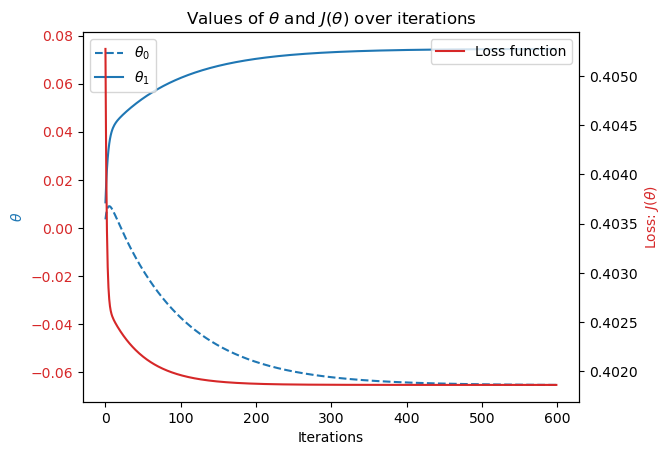

In [111]:
# Create a figure and axis
fig, ax1 = plt.subplots()

# Plot theta0 and theta1 over time
color = 'tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and title
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Create a secondary y-axis for the loss function
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)

# Set title and y-label for the loss function
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Add legends for both axes
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.show()

In [113]:
# Define the range for theta0 and theta1
theta0_vals = np.linspace(-10.06, 10.06, 100)
theta1_vals = np.linspace(-9.92, 10.08, 100)

# Initialize the cost matrix
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

for c1, theta0 in enumerate(theta0_vals):
    for c2, theta1 in enumerate(theta1_vals):
        t = np.array([[theta0], [theta1]])
        J_vals[c1, c2] = compute_cost(X, y, t)

C:\Users\LocalAdmin\AppData\Local\Temp\ipykernel_18024\1418211745.py:11: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



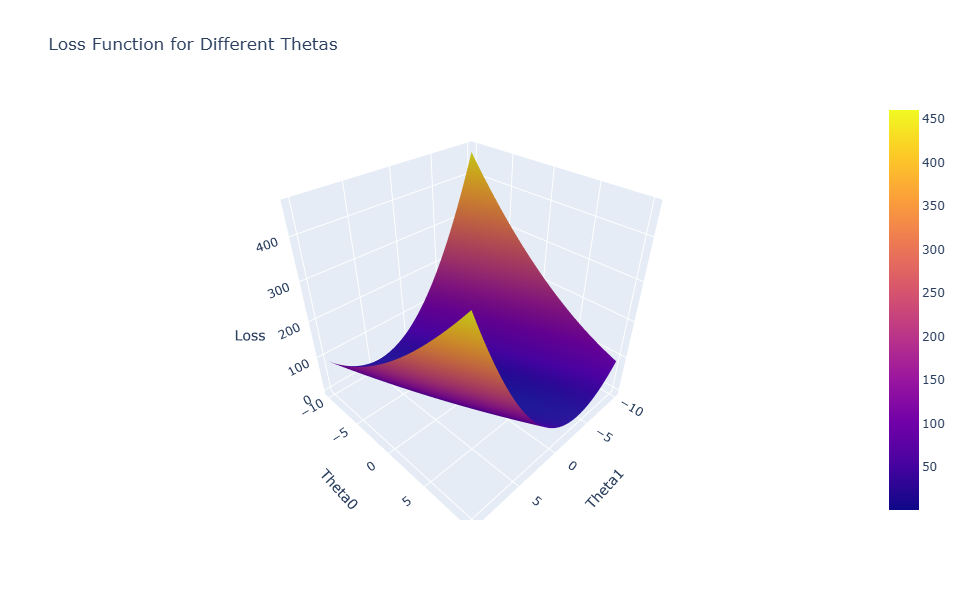

In [114]:
# Assuming theta0_vals, theta1_vals, and J_vals are already defined

# Create the 3D surface plot
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])

# Update layout with titles and axis labels
fig.update_layout(title='Loss Function for Different Thetas',
                  autosize=True,
                  width=600,
                  height=600,
                  scene=dict(
                      xaxis_title='Theta1',
                      yaxis_title='Theta0',
                      zaxis_title='Loss'
                  ))

# Show the plot
fig.show()

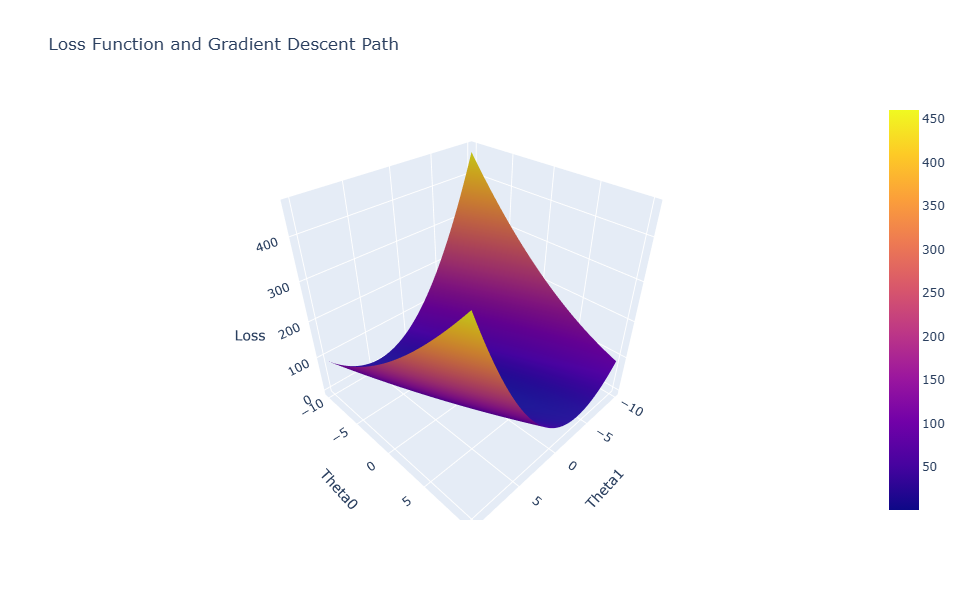

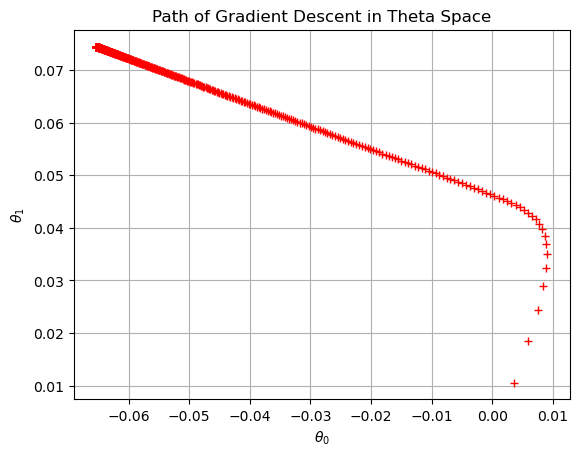

In [117]:
# Assuming theta0_vals, theta1_vals, J_vals, theta0_history, theta1_history, and J_history are already defined

# Create the 3D surface plot
line_marker = dict(color='#101010', width=2)
fig = go.Figure()

# Add surface plot for the loss function
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)

# Add the path of gradient descent
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, mode='lines', line=line_marker, name='Gradient Descent Path')

# Set layout for the plot
fig.update_layout(title='Loss Function and Gradient Descent Path',
                  autosize=True,
                  width=600,
                  height=600,
                  scene=dict(
                      xaxis_title='Theta1',
                      yaxis_title='Theta0',
                      zaxis_title='Loss'
                  ))

# Show the plot
fig.show()

# If you want a 2D plot of just the path:
plt.figure()
plt.plot(theta0_history, theta1_history, 'r+')
plt.title('Path of Gradient Descent in Theta Space')
plt.xlabel('$\\theta_{0}$')
plt.ylabel('$\\theta_{1}$')
plt.grid()
plt.show()

In [225]:
#3. look at a year of temperature data for one of the weather stations (BASEL 2020)

In [119]:
df2['DATE'] = pd.to_datetime(df2['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [121]:
#Reduce your dataset to a single year\n",
baselyear3 = df2[df2['DATE'].astype(str).str.contains('2019')]
baselyear3

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,2019-01-01,1,0.244897,0.518064,0.916434,2.336512,-0.617786,-0.305229,-0.179228,-1.065304,-1.065304,-0.732333,-0.677043,-1.051057
21551,2019-01-02,1,0.660514,-0.164429,-0.619294,2.703329,-1.090326,-0.425473,-0.179228,-1.042106,-1.042106,-0.963204,-0.922292,-1.119781
21552,2019-01-03,1,-1.001953,-1.802410,-0.438620,3.253555,-0.628526,-0.445514,-0.179228,0.117794,0.117794,-1.452108,-1.520087,-1.463401
21553,2019-01-04,1,-0.586336,-1.392915,0.284075,3.085431,-0.650005,-0.445514,-0.179228,0.164190,0.164190,-1.424946,-1.504759,-1.383223
21554,2019-01-05,1,1.076130,-0.710422,0.555086,2.535205,-0.907754,-0.365351,-0.179228,-1.065304,-1.065304,-1.126172,-0.906964,-1.325953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,2019-12-27,12,1.076130,-0.846921,1.458455,1.419469,-1.283638,0.596603,-0.179228,-1.042106,-1.042106,-0.487881,-0.109905,-0.821976
21911,2019-12-28,12,0.660514,-0.300927,0.916434,3.054863,-1.068847,-0.445514,-0.179228,-0.763730,-0.763730,-0.908881,-1.060245,-1.073965
21912,2019-12-29,12,0.244897,-1.392915,1.548792,3.161851,-0.789619,-0.445514,-0.179228,0.071398,0.071398,-1.520011,-1.382134,-1.429039
21913,2019-12-30,12,-1.833187,-0.437426,0.464749,2.657477,-0.757400,-0.445514,-0.179228,0.442567,0.442567,-1.343462,-1.428119,-1.142689


In [123]:
baselyear3.describe()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,2019-07-02 00:00:00,6.526027,-0.079626,-0.190232,-0.326998,-0.158935,-0.044471,-0.014062,-0.158743,0.165398,0.165398,0.170502,0.113129,0.165547
min,2019-01-01 00:00:00,1.000000,-2.248803,-2.075407,-3.058391,-4.327336,-1.305118,-0.445514,-0.179228,-1.065304,-1.065304,-1.669398,-1.872633,-1.887199
25%,2019-04-02 00:00:00,4.000000,-0.586336,-1.119918,-1.070979,-0.903708,-0.950712,-0.445514,-0.179228,-0.902918,-0.902918,-0.555784,-0.738355,-0.604350
50%,2019-07-02 00:00:00,7.000000,0.244897,-0.573924,-0.257946,-0.185357,-0.295600,-0.445514,-0.179228,-0.021394,-0.021394,0.096087,0.104688,0.140160
75%,2019-10-01 00:00:00,10.000000,0.660514,0.245067,0.555086,0.563561,0.778355,-0.024659,-0.179228,1.068913,1.068913,0.897346,0.871092,0.907579
max,2019-12-31 00:00:00,12.000000,1.076130,5.978002,1.729466,3.253555,1.916748,5.486535,1.814604,2.414398,2.414398,2.540605,2.465211,2.556956
std,NaN,3.452584,0.967001,1.375183,1.082488,1.347153,0.947565,0.931946,0.170089,1.073503,1.073503,0.976797,0.965366,0.979090


In [125]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear4 = baselyear3.drop(['DATE','MONTH'], axis=1)

In [127]:
notempyear4

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,0.244897,0.518064,0.916434,2.336512,-0.617786,-0.305229,-0.179228,-1.065304,-1.065304,-0.732333,-0.677043,-1.051057
21551,0.660514,-0.164429,-0.619294,2.703329,-1.090326,-0.425473,-0.179228,-1.042106,-1.042106,-0.963204,-0.922292,-1.119781
21552,-1.001953,-1.802410,-0.438620,3.253555,-0.628526,-0.445514,-0.179228,0.117794,0.117794,-1.452108,-1.520087,-1.463401
21553,-0.586336,-1.392915,0.284075,3.085431,-0.650005,-0.445514,-0.179228,0.164190,0.164190,-1.424946,-1.504759,-1.383223
21554,1.076130,-0.710422,0.555086,2.535205,-0.907754,-0.365351,-0.179228,-1.065304,-1.065304,-1.126172,-0.906964,-1.325953
...,...,...,...,...,...,...,...,...,...,...,...,...
21910,1.076130,-0.846921,1.458455,1.419469,-1.283638,0.596603,-0.179228,-1.042106,-1.042106,-0.487881,-0.109905,-0.821976
21911,0.660514,-0.300927,0.916434,3.054863,-1.068847,-0.445514,-0.179228,-0.763730,-0.763730,-0.908881,-1.060245,-1.073965
21912,0.244897,-1.392915,1.548792,3.161851,-0.789619,-0.445514,-0.179228,0.071398,0.071398,-1.520011,-1.382134,-1.429039
21913,-1.833187,-0.437426,0.464749,2.657477,-0.757400,-0.445514,-0.179228,0.442567,0.442567,-1.343462,-1.428119,-1.142689


In [129]:
# Determine if it's a leap year
year = 1990  # Change this to the year you're interested in
is_leap_year = (year % 4 == 0 and year % 100 != 0) or (year % 400 == 0)

# Set total number of days
total_days = 366 if is_leap_year else 365

# Create an index from 0.01 to the scaled number of days
i = np.arange(0.01, total_days * 0.01 + 0.01, 0.01)  # Needs to be one greater than total number of days

# Create DataFrame
index = pd.DataFrame(data=i, columns=['index'])
index.head()  # Display the first few rows of the DataFrame

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05


In [133]:
n_rows4 = notempyear4.shape[0]
n_rows4

365

In [137]:
# Assuming baselyear4 is already defined and n_rows4 is the number of rows in the DataFrame
# For example:
# n_rows4 = len(baselyear4)

# Convert the index DataFrame to a NumPy array and reshape it
X = index.to_numpy().reshape(n_rows4, 1)

# Create a vector of ones to represent x_0 for the bias term in linear regression
ones = np.ones((n_rows4, 1))

# Concatenate the ones vector with the index array to form the feature matrix
X = np.concatenate((ones, X), axis=1)

# Extract the target variable, reshaping it to match the dimensions required
y = notempyear4['BASEL_temp_mean'].to_numpy().reshape(n_rows4, 1)

In [139]:
X.shape, y.shape

((365, 2), (365, 1))

In [141]:
#Look at one year of temperature data over time\n",
plt.scatter(x=index['index'], y=notempyear4['BASEL_temp_mean'])
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [143]:
notempyear4

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,0.244897,0.518064,0.916434,2.336512,-0.617786,-0.305229,-0.179228,-1.065304,-1.065304,-0.732333,-0.677043,-1.051057
21551,0.660514,-0.164429,-0.619294,2.703329,-1.090326,-0.425473,-0.179228,-1.042106,-1.042106,-0.963204,-0.922292,-1.119781
21552,-1.001953,-1.802410,-0.438620,3.253555,-0.628526,-0.445514,-0.179228,0.117794,0.117794,-1.452108,-1.520087,-1.463401
21553,-0.586336,-1.392915,0.284075,3.085431,-0.650005,-0.445514,-0.179228,0.164190,0.164190,-1.424946,-1.504759,-1.383223
21554,1.076130,-0.710422,0.555086,2.535205,-0.907754,-0.365351,-0.179228,-1.065304,-1.065304,-1.126172,-0.906964,-1.325953
...,...,...,...,...,...,...,...,...,...,...,...,...
21910,1.076130,-0.846921,1.458455,1.419469,-1.283638,0.596603,-0.179228,-1.042106,-1.042106,-0.487881,-0.109905,-0.821976
21911,0.660514,-0.300927,0.916434,3.054863,-1.068847,-0.445514,-0.179228,-0.763730,-0.763730,-0.908881,-1.060245,-1.073965
21912,0.244897,-1.392915,1.548792,3.161851,-0.789619,-0.445514,-0.179228,0.071398,0.071398,-1.520011,-1.382134,-1.429039
21913,-1.833187,-0.437426,0.464749,2.657477,-0.757400,-0.445514,-0.179228,0.442567,0.442567,-1.343462,-1.428119,-1.142689


In [147]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear4['BASEL_temp_mean'].min()

-1.669398054518736

In [149]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear4['BASEL_temp_mean'].max()

2.540605078587011

In [151]:
def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y, and coefficients theta,
    compute the loss."""
    
    m = len(y)  # Number of training examples
    J = 0  # Initialize loss to zero
    
    # Reshape theta to ensure it's a column vector
    theta = theta.reshape(2, 1)
    
    # Calculate the hypothesis - y_hat
    h_x = np.dot(X, theta)
    
    # Subtract y from y_hat, square the result, and sum
    error_term = sum((h_x - y) ** 2)
    
    # Divide by twice the number of samples to compute the average cost
    loss = error_term / (2 * m)
    
    return loss

In [153]:
compute_cost(X,y)

array([0.49029456])

In [155]:
def gradient_descent(X, y, theta=np.array([[0],[0]]), alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimization technique. 
    Alpha is the learning rate.
    """
    m = len(y)  # Number of training examples
    J_history = []  # To store the cost at each iteration
    theta0_history = []  # To store values of theta0
    theta1_history = []  # To store values of theta1
    theta = theta.reshape(2, 1)  # Ensure theta is a column vector
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)  # Calculate the error
        
        # Compute gradients for each parameter
        term0 = (alpha/m) * sum(error * X[:, 0].reshape(m, 1))
        term1 = (alpha/m) * sum(error * X[:, 1].reshape(m, 1))
        
        # Update theta
        term_vector = np.array([[term0], [term1]])
        theta = theta - term_vector.reshape(2, 1)
        
        # Store history values for later analysis
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X, y, theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [157]:
num_iterations = 500  # Number of iterations for gradient descent
theta_init = np.array([[0], [0]])  # Initial guess for theta values; you can start with [1, 1] if preferred
alpha = 0.05  # Learning rate; adjust based on convergence behavior

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

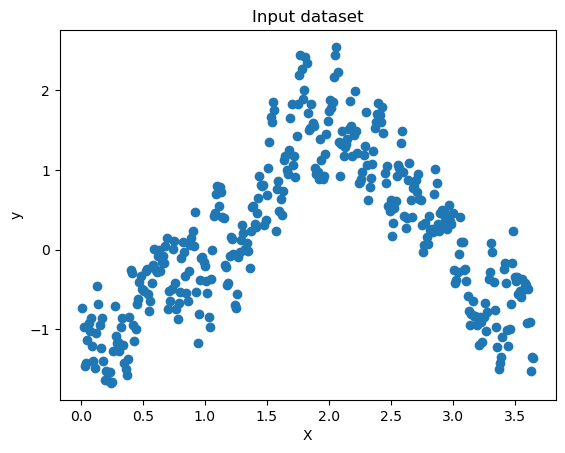

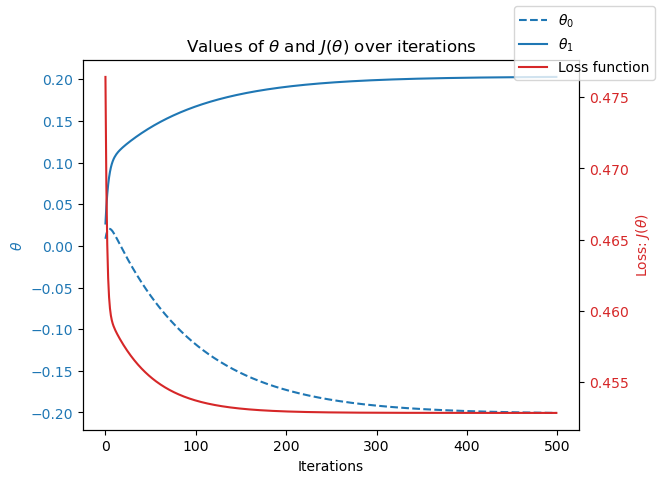

In [159]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# Plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set labels for the first y-axis
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()  # Create a second y-axis
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Add legends
fig.legend()

# Display the plot with the legend
plt.show()

In [161]:
# Define theta ranges
theta0_vals = np.linspace(0.2, -0.02, 100)
theta1_vals = np.linspace(0, 0.15, 100)

# Initialize a grid to hold the cost values
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# Compute cost for each combination of theta using vectorization
for i, theta0 in enumerate(theta0_vals):
    for j, theta1 in enumerate(theta1_vals):
        t = np.array([theta0, theta1]).reshape(2, 1)  # Reshape to column vector
        J_vals[i, j] = compute_cost(X, y, t)

# J_vals is now a 2D array containing the cost for each (theta0, theta1) combination

C:\Users\LocalAdmin\AppData\Local\Temp\ipykernel_18024\762898238.py:12: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



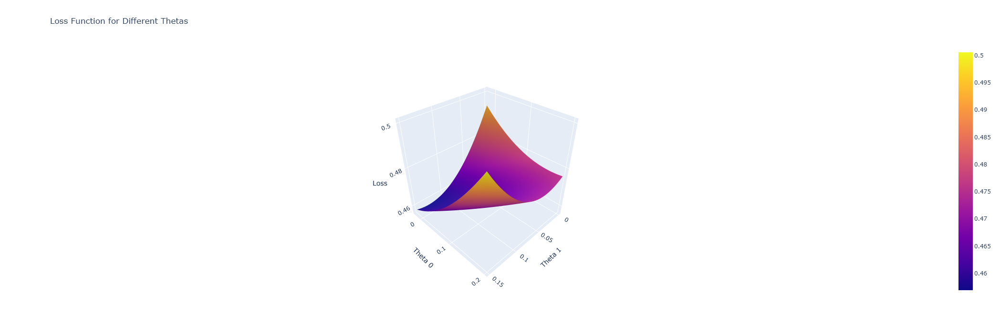

In [162]:
# Create the 3D surface plot
fig = go.Figure(data=[go.Surface(z=J_vals, x=theta1_vals, y=theta0_vals)])

# Update layout settings
fig.update_layout(
    title='Loss Function for Different Thetas',
    autosize=True,
    width=700,
    height=700,
    scene=dict(
        xaxis_title='Theta 1',
        yaxis_title='Theta 0',
        zaxis_title='Loss',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))  # Adjust the camera angle
    )
)

# Show the figure
fig.show()

In [287]:
### 4. look at a year of temperature data for one of the weather stations (Madrid 1960)

In [165]:
madrid= df[['DATE', 'MONTH','MADRID_cloud_cover','MADRID_wind_speed','MADRID_humidity','MADRID_pressure',
    'MADRID_global_radiation','MADRID_precipitation','MADRID_sunshine',
    'MADRID_sunshine', 'MADRID_temp_mean', 'MADRID_temp_min','MADRID_temp_max']].copy()

In [167]:
madrid['DATE'] = pd.to_datetime(madrid['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [169]:
madrid

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,1960-01-01,1,0.855172,-1.419038,1.887115,1.149046,-1.423735,-0.315682,-1.521762,-1.521762,-0.988280,-0.877723,-1.044732
1,1960-01-02,1,1.225610,-0.910841,1.548493,1.068070,-1.496755,-0.315682,-1.642337,-1.642337,-0.691740,-0.411866,-0.882444
2,1960-01-03,1,0.484733,-0.212070,1.774241,1.513435,-1.319420,-0.315682,-1.304726,-1.304726,-0.853490,-0.567152,-1.044732
3,1960-01-04,1,-1.367458,-0.720267,0.927685,1.432460,-0.766551,-0.315682,0.238641,0.238641,-0.624345,-0.862194,-0.430357
4,1960-01-05,1,-0.626581,-0.720267,0.306877,1.270509,-0.829140,-0.315682,0.021605,0.021605,-0.381721,-0.287638,-0.441949
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,2022-10-27,10,1.596048,-0.339119,-0.370367,0.393274,-0.005053,-0.001685,-0.581273,-0.581273,0.683127,0.954646,0.473818
22946,2022-10-28,10,1.596048,-0.021496,-0.426804,0.622705,-0.005053,-0.001685,-0.918884,-0.918884,0.561815,0.721718,0.427450
22947,2022-10-29,10,1.596048,-0.212070,-0.708990,0.150348,-0.005053,-0.001685,0.093950,0.093950,0.548336,0.830417,0.323122
22948,2022-10-30,10,0.484733,-0.720267,0.419752,0.150348,-0.005053,-0.001685,-1.111805,-1.111805,0.103526,0.473261,-0.175333


In [171]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.\n",
notempmad = madrid.drop(['DATE','MONTH'], axis=1)

In [173]:
#Look at a whisker plot of the data to see variations in temperatures\n",
notempmad.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(1, 0, 'MADRID_cloud_cover'),
  Text(2, 0, 'MADRID_wind_speed'),
  Text(3, 0, 'MADRID_humidity'),
  Text(4, 0, 'MADRID_pressure'),
  Text(5, 0, 'MADRID_global_radiation'),
  Text(6, 0, 'MADRID_precipitation'),
  Text(7, 0, 'MADRID_sunshine'),
  Text(8, 0, 'MADRID_sunshine'),
  Text(9, 0, 'MADRID_temp_mean'),
  Text(10, 0, 'MADRID_temp_min'),
  Text(11, 0, 'MADRID_temp_max')])

In [175]:
#Reduce your dataset to a single year\n",
madridyear = madrid[madrid['DATE'].astype(str).str.contains('1960')] #<-----INSERT YEAR HERE\n",
madridyear

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,1960-01-01,1,0.855172,-1.419038,1.887115,1.149046,-1.423735,-0.315682,-1.521762,-1.521762,-0.988280,-0.877723,-1.044732
1,1960-01-02,1,1.225610,-0.910841,1.548493,1.068070,-1.496755,-0.315682,-1.642337,-1.642337,-0.691740,-0.411866,-0.882444
2,1960-01-03,1,0.484733,-0.212070,1.774241,1.513435,-1.319420,-0.315682,-1.304726,-1.304726,-0.853490,-0.567152,-1.044732
3,1960-01-04,1,-1.367458,-0.720267,0.927685,1.432460,-0.766551,-0.315682,0.238641,0.238641,-0.624345,-0.862194,-0.430357
4,1960-01-05,1,-0.626581,-0.720267,0.306877,1.270509,-0.829140,-0.315682,0.021605,0.021605,-0.381721,-0.287638,-0.441949
...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,1960-12-27,12,0.114295,1.058423,1.040559,-0.065587,-1.142085,-0.184850,-0.822424,-0.822424,-1.069155,-1.001951,-1.091100
362,1960-12-28,12,0.114295,2.455966,0.476189,0.649697,-0.912592,-0.054018,-0.147201,-0.147201,-1.338737,-1.172765,-1.427268
363,1960-12-29,12,0.484733,2.837114,0.024692,0.865631,-1.465460,-0.315682,-1.594107,-1.594107,-0.920885,-0.691380,-1.067916
364,1960-12-30,12,0.484733,1.376046,0.419752,0.946607,-0.860435,-0.315682,-0.026625,-0.026625,-0.772615,-0.567152,-0.905628


In [177]:
madridyear.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,366,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1960-07-01 12:00:00,6.513661,0.253969,0.127943,0.151753,-0.219425,0.030858,0.106341,-0.075317,-0.075317,-0.130480,-0.085300,-0.160827
min,1960-01-01 00:00:00,1.000000,-1.367458,-1.419038,-2.007042,-2.791761,-1.684522,-0.315682,-1.859373,-1.859373,-2.322710,-2.337406,-2.250299
25%,1960-04-01 06:00:00,4.000000,-0.626581,-0.720267,-0.821864,-0.683025,-0.996044,-0.315682,-1.129891,-1.129891,-0.890557,-0.753495,-1.021548
50%,1960-07-01 12:00:00,7.000000,0.484733,-0.021496,0.194003,-0.241033,-0.046779,-0.315682,0.106008,0.106008,-0.294107,-0.225524,-0.291253
75%,1960-09-30 18:00:00,9.750000,1.225610,1.058423,1.153433,0.244819,1.139801,-0.191392,0.889749,0.889749,0.787590,0.768303,0.760720
max,1960-12-31 00:00:00,12.000000,1.596048,3.154737,2.056426,2.161239,1.872613,7.351085,1.637317,1.637317,1.936682,2.010587,1.876449
std,NaN,3.455958,0.967145,1.072020,1.087993,0.853430,1.143713,1.081708,1.121944,1.121944,0.979590,0.943665,1.004167


In [179]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyearmad = madridyear.drop(['DATE','MONTH'], axis=1)

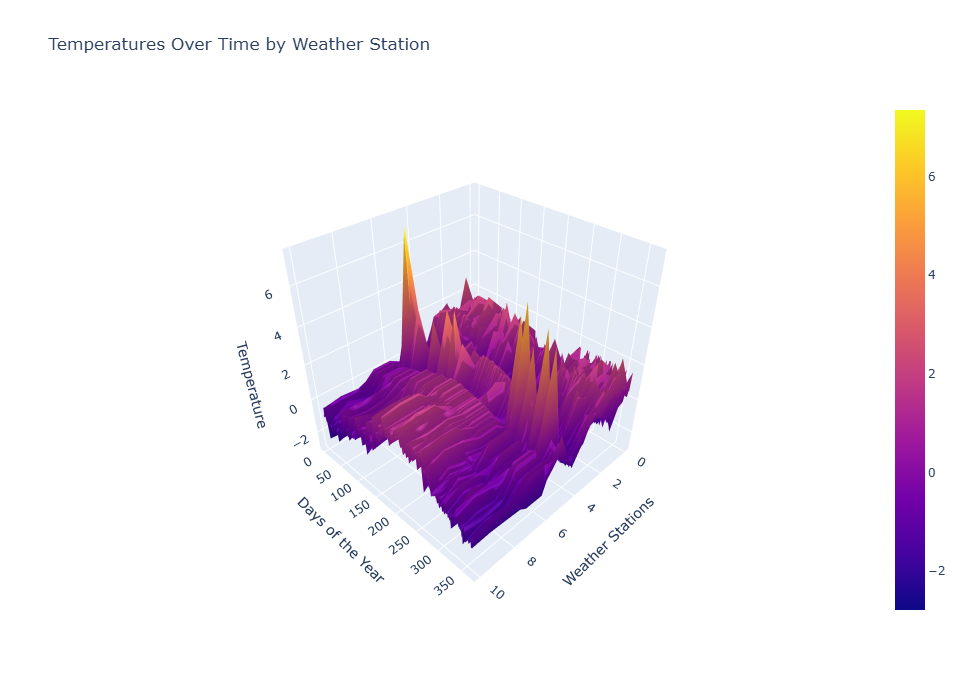

In [181]:
# Assuming notempyearmad is a DataFrame with temperatures
# Create the 3D surface plot
fig = go.Figure(data=[go.Surface(z=notempyearmad.values)])

# Update layout settings
fig.update_layout(
    title='Temperatures Over Time by Weather Station',
    autosize=False,
    width=700,
    height=700,
    scene=dict(
        xaxis_title='Weather Stations',
        yaxis_title='Days of the Year',
        zaxis_title='Temperature',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))  # Adjust camera angle for better view
    )
)

# Show the figure
fig.show()

In [183]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [185]:
n_rowsmad = madridyear.shape[0]
n_rowsmad

366

In [187]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rowsmad,1)
#Represent x_0 as a vector of 1s for vector computation\
ones = np.ones((n_rowsmad,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad,1) #<----INSERT WEATHER STATION HERE

In [189]:
X.shape, y.shape

((366, 2), (366, 1))

In [193]:
#Look at one year of temperature data over time\n",
plt.scatter(x=index['index'], y=madridyear['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE\
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [195]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
madridyear['MADRID_temp_mean'].min()

-2.322710316206882

In [197]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
madridyear['MADRID_temp_mean'].max()

1.9366821017377809

In [199]:
def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y, and coefficients theta,
    compute the loss."""
    
    m = len(y)  # Number of samples
    theta = theta.reshape(2, 1)  # Ensure theta is a column vector

    # Calculate the hypothesis - y_hat
    h_x = np.dot(X, theta)
    
    # Calculate the squared error
    squared_error = np.sum((h_x - y) ** 2)

    # Calculate the average loss
    loss = squared_error / (2 * m)
    
    return loss  # Return loss

In [201]:
compute_cost(X,y)

0.4869997094925762

In [203]:
def gradient_descent(X, y, theta=np.array([[0],[0]]), alpha=0.01, num_iterations=1500):
    """Solve for theta using Gradient Descent optimization technique.
    Alpha is the learning rate."""
    
    m = len(y)  # Number of samples
    J_history = []  # History of loss values
    theta0_history = []  # History of theta0 values
    theta1_history = []  # History of theta1 values
    theta = theta.reshape(2, 1)  # Ensure theta is a column vector
    
    for i in range(num_iterations):
        error = np.dot(X, theta) - y  # Calculate the error
        
        # Calculate the gradient
        term0 = (alpha / m) * np.sum(error * X[:, 0].reshape(m, 1))
        term1 = (alpha / m) * np.sum(error * X[:, 1].reshape(m, 1))
        
        # Update theta
        theta -= np.array([[term0], [term1]])
        
        # Store history values
        theta0_history.append(float(theta[0]))  # Convert to float for clarity
        theta1_history.append(float(theta[1]))  # Convert to float for clarity
        J_history.append(compute_cost(X, y, theta))  # Store loss value
    
    return theta, J_history, theta0_history, theta1_history

C:\Users\LocalAdmin\AppData\Local\Temp\ipykernel_12016\2056895408.py:22: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\LocalAdmin\AppData\Local\Temp\ipykernel_12016\2056895408.py:23: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



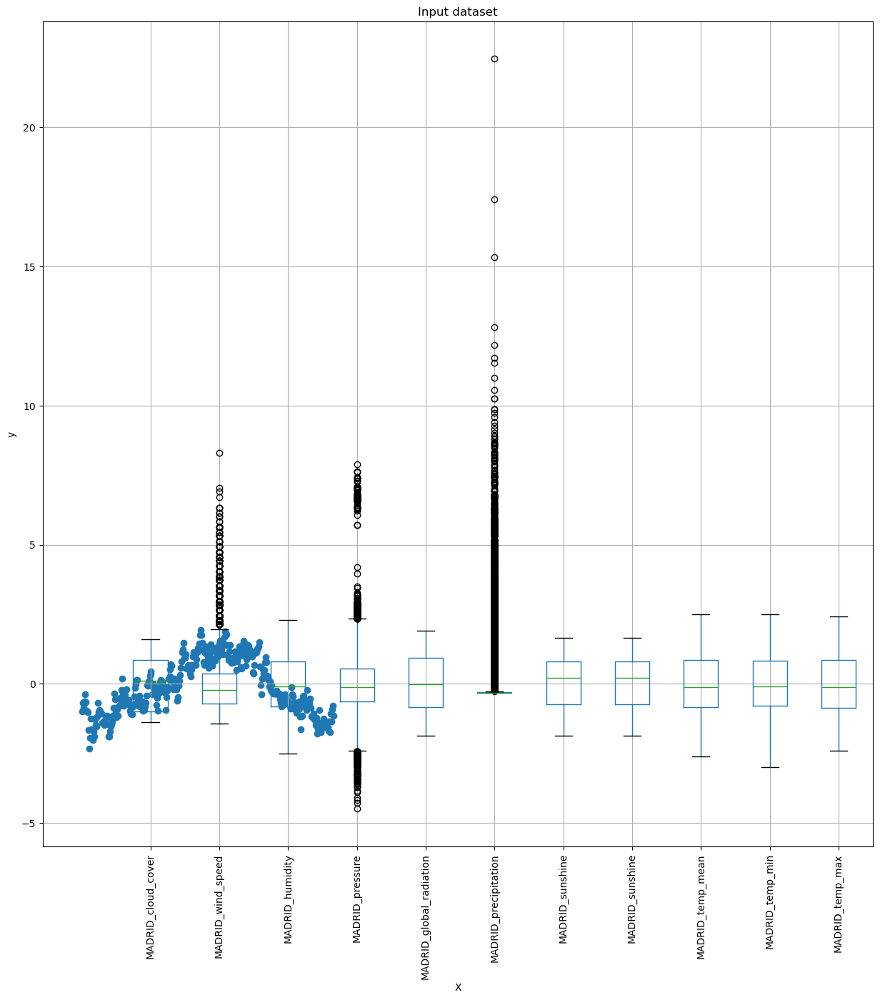

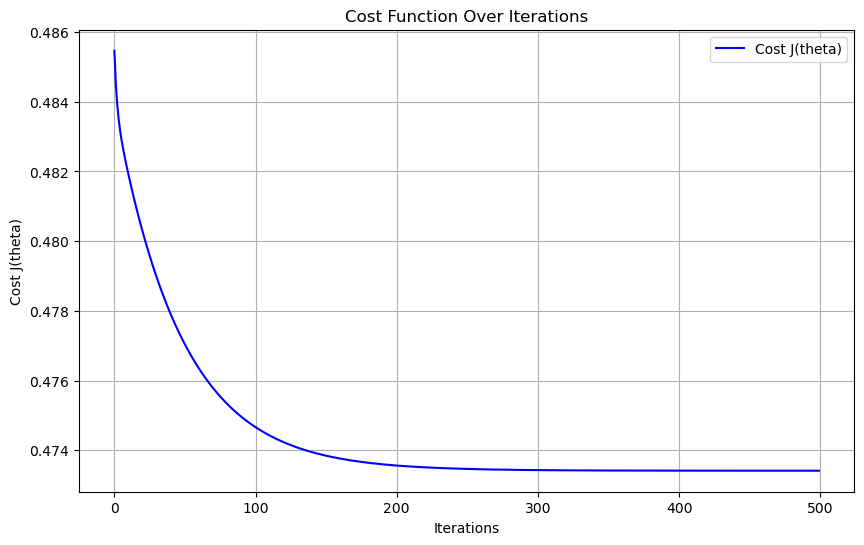

In [334]:
# This runs your data through a gradient descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations = 500  # Decide how many iterations you need. Start small and work up.
theta_init = np.array([[0.0], [0.0]])  # Start with floating-point values for theta
alpha = 0.05  # Decide what your step size is.

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

# Plotting the cost over iterations
plt.figure(figsize=(10, 6))
plt.plot(J_history, label='Cost J(theta)', color='blue')
plt.xlabel('Iterations')
plt.ylabel('Cost J(theta)')
plt.title('Cost Function Over Iterations')
plt.legend()
plt.grid()
plt.show()

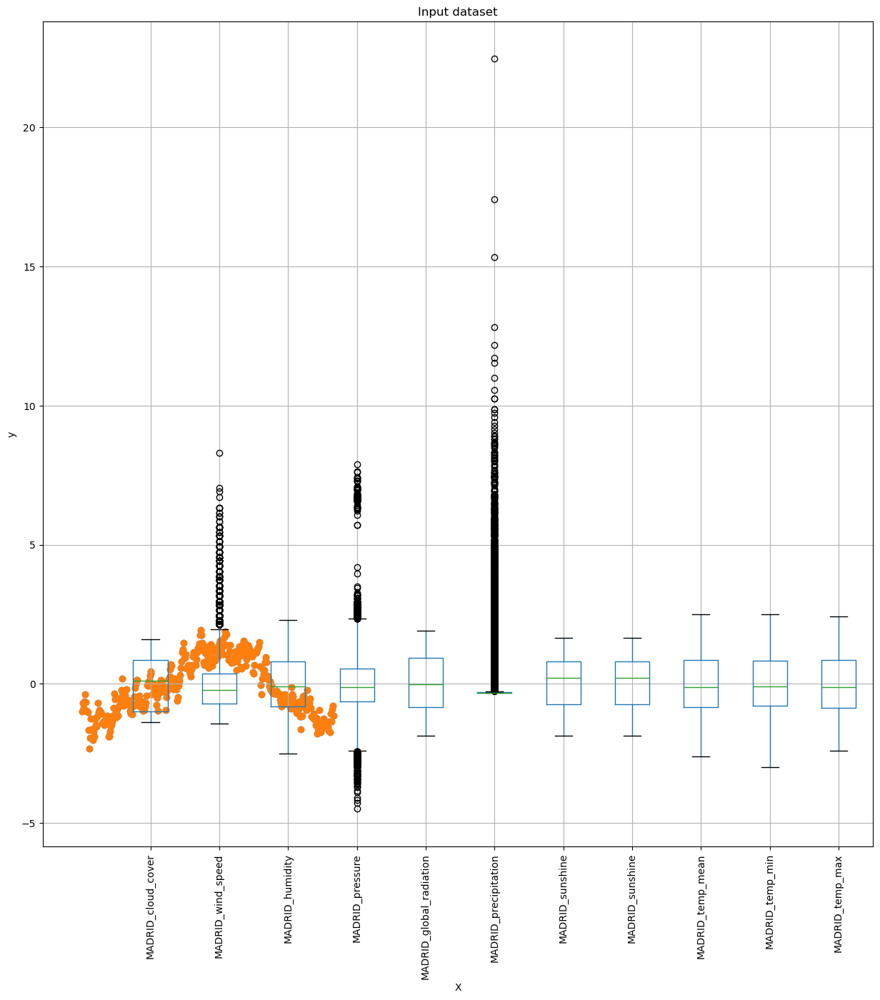

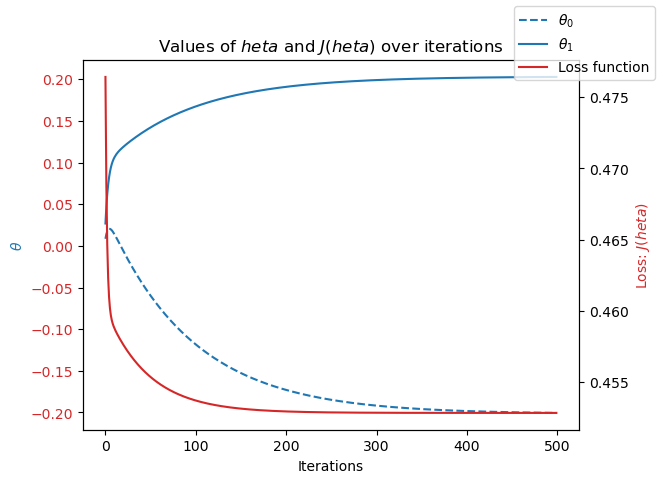

In [205]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# Plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label=r'$\theta_{0}$', linestyle='--', color=color)  # Use raw string for LaTeX
ax1.plot(theta1_history, label=r'$\theta_{1}$', linestyle='-', color=color)    # Use raw string for LaTeX

ax1.set_xlabel('Iterations')
ax1.set_ylabel(r'$\theta$', color=color)  # Use raw string for LaTeX
ax1.tick_params(axis='y', labelcolor=color)

# Plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\theta$ and $J(\theta)$ over iterations')  # Use raw string for LaTeX
ax2.set_ylabel('Loss: $J(\theta)$', color=color)  # Use raw string for LaTeX
ax1.tick_params(axis='y', labelcolor=color)

# Display the plot with the legend
fig.legend()
plt.show()

In [207]:
# Define the range for theta values
theta0_vals = np.linspace(-0.3, 0, 100)  # Adjust as necessary based on previous results
theta1_vals = np.linspace(0, 0.1, 100)   # Adjust as necessary based on previous results
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# Compute cost for each combination of theta
for c1, theta0 in enumerate(theta0_vals):
    for c2, theta1 in enumerate(theta1_vals):
        t = np.array([[theta0], [theta1]])  # Ensure the shape is (2, 1)
        J_vals[c1, c2] = compute_cost(X, y, t)

# Now J_vals contains the cost for each (theta0, theta1) pair

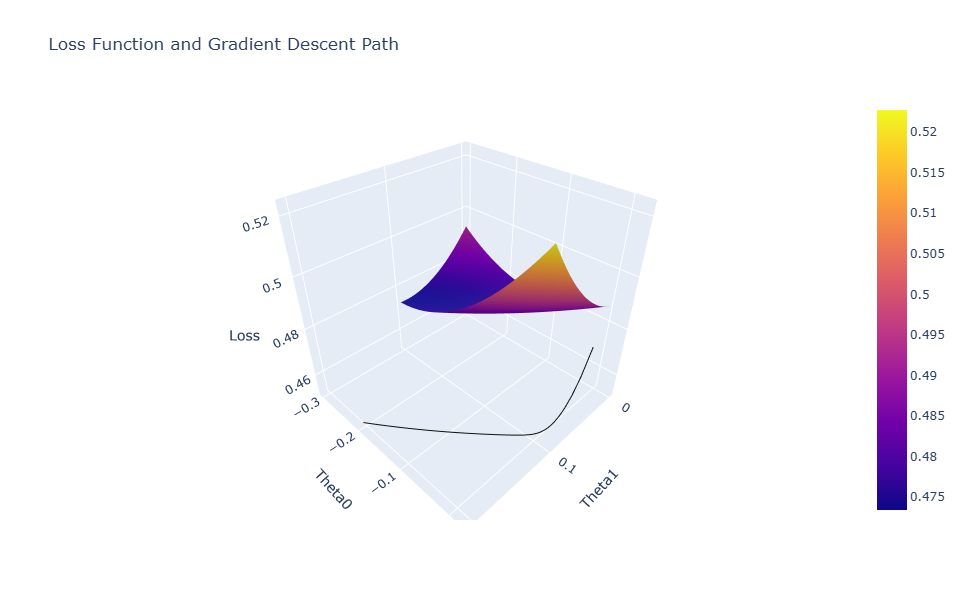

In [211]:
# Assuming theta0_vals, theta1_vals, J_vals, theta0_history, theta1_history, and J_history are already defined

# Create the 3D surface plot
line_marker = dict(color='#101010', width=2)
fig = go.Figure()

# Add surface plot for the loss function
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)

# Add the path of gradient descent
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, mode='lines', line=line_marker, name='Gradient Descent Path')

# Set layout for the plot
fig.update_layout(title='Loss Function and Gradient Descent Path',
                  autosize=True,
                  width=600,
                  height=600,
                  scene=dict(
                      xaxis_title='Theta1',
                      yaxis_title='Theta0',
                      zaxis_title='Loss'
                  ))

# Show the plot
fig.show()

In [213]:
#Reduce your dataset to a single year
madridyear90 = madrid[madrid['DATE'].astype(str).str.contains('1990')] #<-----INSERT YEAR HERE
madridyear90

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
10958,1990-01-01,1,1.596048,-1.419038,2.112863,0.541729,-1.674090,1.385136,-1.859373,-1.859373,-0.974801,-0.473981,-1.322940
10959,1990-01-02,1,1.596048,-0.720267,1.774241,0.771160,-1.674090,0.992640,-1.859373,-1.859373,-1.136550,-0.691380,-1.438860
10960,1990-01-03,1,1.225610,-0.720267,1.604930,-0.632415,-1.548912,-0.132517,-1.738798,-1.738798,-1.069155,-0.800080,-1.253388
10961,1990-01-04,1,0.114295,-0.720267,0.758374,0.865631,-0.943887,-0.315682,-0.316007,-0.316007,-1.136550,-1.172765,-1.079508
10962,1990-01-05,1,-0.997020,-0.720267,1.040559,1.729370,-0.850003,-0.315682,-0.050740,-0.050740,-1.082634,-1.033008,-1.091100
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,1990-12-27,12,0.855172,-0.339119,1.548493,1.000591,-1.653227,-0.315682,-1.859373,-1.859373,-0.840010,-0.598209,-0.998364
11319,1990-12-28,12,1.596048,-0.529693,1.774241,1.472947,-1.569775,-0.080184,-1.811143,-1.811143,-0.907406,-0.567152,-1.137468
11320,1990-12-29,12,1.596048,-0.910841,2.056426,1.432460,-1.767973,-0.054018,-1.859373,-1.859373,-0.853490,-0.349752,-1.207020
11321,1990-12-30,12,1.596048,-1.228464,2.056426,1.553923,-1.715816,-0.263350,-1.859373,-1.859373,-0.893927,-0.411866,-1.230204


In [215]:
madridyear90.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1990-07-02 00:00:00,6.526027,-0.150594,-0.072664,-0.170905,0.306716,0.002663,-0.097533,-0.020085,-0.020085,0.063753,0.085770,0.045645
min,1990-01-01 00:00:00,1.000000,-1.367458,-1.419038,-2.514975,-2.305908,-1.830562,-0.315682,-1.859373,-1.859373,-1.743109,-1.871550,-1.832987
25%,1990-04-02 00:00:00,4.000000,-0.997020,-0.529693,-0.934738,-0.335505,-0.870866,-0.315682,-0.701848,-0.701848,-0.799573,-0.753495,-0.847668
50%,1990-07-02 00:00:00,7.000000,-0.256143,-0.212070,-0.201056,0.109860,-0.078074,-0.315682,0.190411,0.190411,-0.112140,-0.101296,-0.071005
75%,1990-10-01 00:00:00,10.000000,0.484733,0.359652,0.589063,0.879127,0.912917,-0.315682,0.769173,0.769173,0.993146,0.985703,0.972274
max,1990-12-31 00:00:00,12.000000,1.596048,2.265392,2.112863,2.849531,1.768298,5.938098,1.492626,1.492626,2.165827,2.321158,1.992369
std,NaN,3.452584,0.891112,0.630844,1.036050,0.912027,0.993170,0.709334,0.967090,0.967090,1.023386,1.039731,1.004720


In [217]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest
notempyearmad90 = madridyear90.drop(['DATE','MONTH'], axis=1)

In [219]:
notempyearmad90

,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
10958,1.596048,-1.419038,2.112863,0.541729,-1.674090,1.385136,-1.859373,-1.859373,-0.974801,-0.473981,-1.322940
10959,1.596048,-0.720267,1.774241,0.771160,-1.674090,0.992640,-1.859373,-1.859373,-1.136550,-0.691380,-1.438860
10960,1.225610,-0.720267,1.604930,-0.632415,-1.548912,-0.132517,-1.738798,-1.738798,-1.069155,-0.800080,-1.253388
10961,0.114295,-0.720267,0.758374,0.865631,-0.943887,-0.315682,-0.316007,-0.316007,-1.136550,-1.172765,-1.079508
10962,-0.997020,-0.720267,1.040559,1.729370,-0.850003,-0.315682,-0.050740,-0.050740,-1.082634,-1.033008,-1.091100
...,...,...,...,...,...,...,...,...,...,...,...
11318,0.855172,-0.339119,1.548493,1.000591,-1.653227,-0.315682,-1.859373,-1.859373,-0.840010,-0.598209,-0.998364
11319,1.596048,-0.529693,1.774241,1.472947,-1.569775,-0.080184,-1.811143,-1.811143,-0.907406,-0.567152,-1.137468
11320,1.596048,-0.910841,2.056426,1.432460,-1.767973,-0.054018,-1.859373,-1.859373,-0.853490,-0.349752,-1.207020
11321,1.596048,-1.228464,2.056426,1.553923,-1.715816,-0.263350,-1.859373,-1.859373,-0.893927,-0.411866,-1.230204


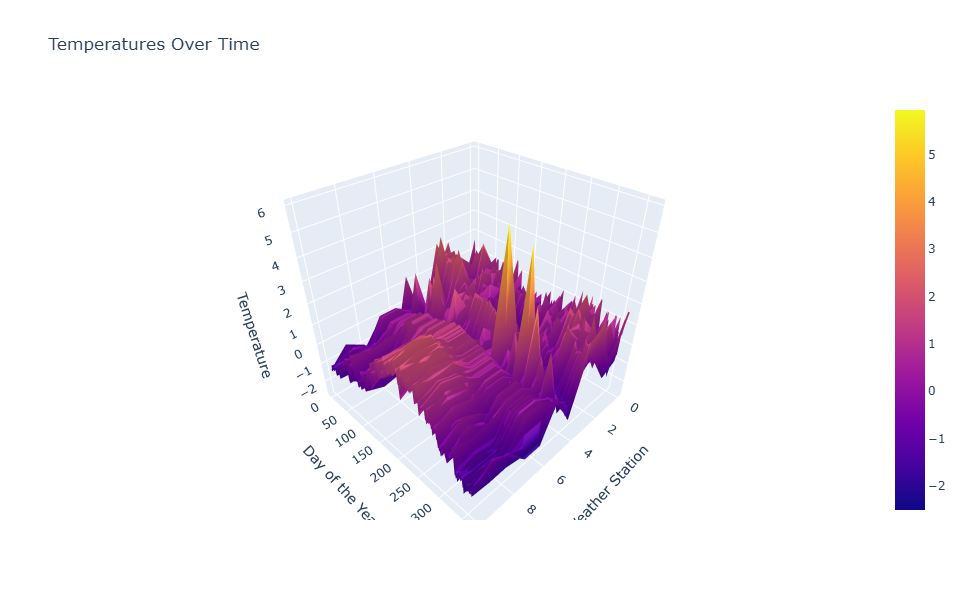

In [221]:
# Assuming 'notempyearmad90' is a DataFrame with temperature data
# Ensure that 'notempyearmad90' is structured correctly: rows for days and columns for stations

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(z=notempyearmad90.values)])

# Update layout with titles and sizing
fig.update_layout(
    title='Temperatures Over Time',
    scene=dict(
        xaxis_title='Weather Station',
        yaxis_title='Day of the Year',
        zaxis_title='Temperature',
    ),
    autosize=False,
    width=600,
    height=600
)

# Display the plot
fig.show()

In [223]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)\n",
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [225]:
n_rowsmad90 = madridyear90.shape[0]
n_rowsmad90

365

In [227]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rowsmad90,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsmad90,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear90['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad90,1) #<----INSERT WEATHER STATION HERE

In [229]:
X.shape, y.shape

((365, 2), (365, 1))

In [231]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=madridyear90['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [233]:
#what is the min temperature? (Note gradient descent is not actually finding this number)\n",
madridyear90['MADRID_temp_mean'].min()

-1.743109449208083

In [235]:
#what is the max temperature? (Note gradient descent is not actually finding this number)\n",
madridyear90['MADRID_temp_mean'].max()

2.1658266305512592

In [237]:
def compute_cost(X, y, theta=np.array([[0], [0]])):
    """Given covariate matrix X, the prediction results y, and coefficients theta,
    compute the loss."""
    
    # Ensure theta is in the correct shape
    theta = theta.reshape(-1, 1)
    
    # Check dimensions
    if X.shape[1] != theta.shape[0]:
        raise ValueError("The number of features in X must match the size of theta.")
    if len(y) != X.shape[0]:
        raise ValueError("The number of samples in y must match the number of rows in X.")
    
    m = len(y)  # Number of samples
    J = 0  # Initialize loss to zero
    
    # Calculate the hypothesis - y_hat
    h_x = np.dot(X, theta)
    
    # Calculate the error term
    error_term = np.sum((h_x - y) ** 2)
    
    # Compute the loss
    loss = error_term / (2 * m)
    
    return loss

In [239]:
def gradient_descent(X, y, theta=None, alpha=0.01, num_iterations=1500):
    """Solve for theta using Gradient Descent optimization technique.
    Alpha is the learning rate."""
    
    m = len(y)  # Number of samples
    J_history = []
    theta_history = []

    if theta is None:
        theta = np.zeros((X.shape[1], 1))  # Initialize theta based on number of features
    else:
        theta = theta.reshape(-1, 1)  # Ensure theta is a column vector

    for i in range(num_iterations):
        error = np.dot(X, theta) - y  # Error vector
        
        # Update theta using vectorized operations
        theta -= (alpha / m) * np.dot(X.T, error)  # X.T is the transpose of X
        
        # Store history values
        theta_history.append(theta.flatten())  # Flatten to avoid nested lists
        J_history.append(compute_cost(X, y, theta))  # Cost for current theta

        # Optional: Print cost every 100 iterations for debugging
        if i % 100 == 0:
            print(f"Iteration {i}: Cost {J_history[-1]}")
    
    return theta, J_history, theta_history

In [241]:
def gradient_descent(X, y, theta=np.array([[0.0],[0.0]], dtype=np.float64), alpha=0.01, num_iterations=1500):
    m = len(y)
    J_history = []
    theta0_history = []  # To track theta0 values
    theta1_history = []  # To track theta1 values
    
    theta = theta.astype(np.float64)  # Ensure theta is float

    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)  # Error vector

        # Update theta using vectorized operations
        theta -= (alpha / m) * np.dot(X.T, error)  # X.T is the transpose of X

        # Store history values
        J_history.append(compute_cost(X, y, theta))
        theta0_history.append(theta[0, 0])  # Store theta0 value
        theta1_history.append(theta[1, 0])  # Store theta1 value

    return theta, J_history, theta0_history, theta1_history  # Return all four values

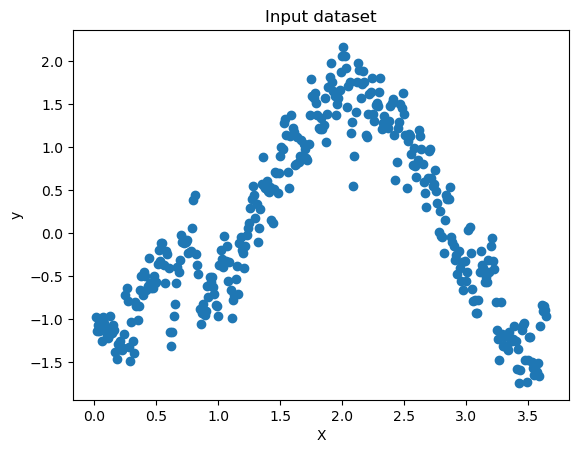

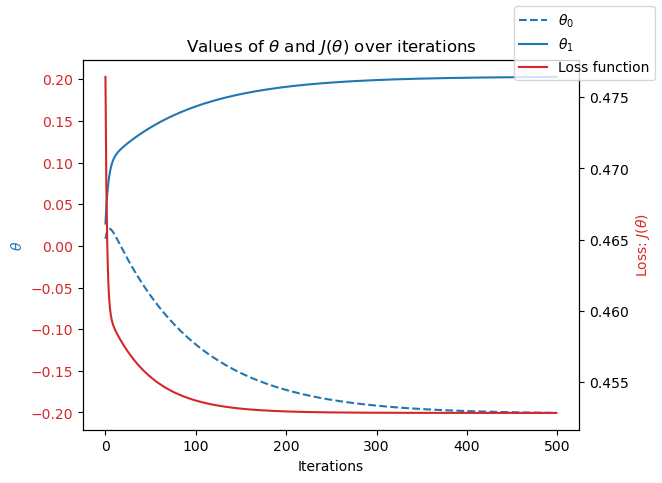

In [243]:
import matplotlib.pyplot as plt

# This will plot your loss, theta0, and theta1.
fig, ax1 = plt.subplots()

# Plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Show legends
fig.legend()
# Display the plot with the legend
plt.show()

In [245]:
# theta range
theta0_vals = np.linspace(-0.10, 0, 100)  # Limits for theta0
theta1_vals = np.linspace(0.05, 0.1, 100)  # Limits for theta1
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1 = 0
c2 = 0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.reshape(2, 1))  # Directly assign the float value
        c2 += 1  # increment c2 for the next theta1 value
    c1 += 1  # increment c1 for the next theta0 value
    c2 = 0  # reinitialize c2 to 0 for the next row

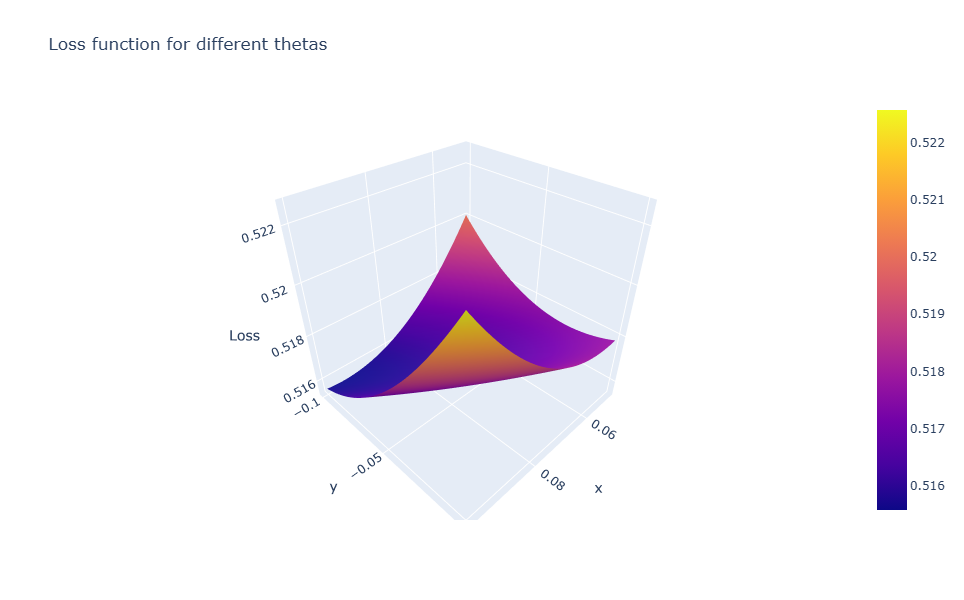

In [247]:
import numpy as np
import plotly.graph_objects as go

# Assuming J_vals, theta0_vals, and theta1_vals are defined from previous calculations

# Create the surface plot
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])

# Update layout for better visibility
fig.update_layout(title='Loss function for different thetas',
                  autosize=True,
                  width=600, height=600,
                  xaxis_title='Theta1',
                  yaxis_title='Theta0',
                  scene=dict(zaxis_title='Loss'))

# Show the figure
fig.show()

In [387]:
### 5. look at a year of temperature data for one of the weather stations (Madrid 2020)

In [249]:
#Reduce your dataset to a single year\n",
madridyear2020 = madrid[madrid['DATE'].astype(str).str.contains('2020')] #<-----INSERT YEAR HERE
madridyear2020

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
21915,2020-01-01,1,-0.997020,-1.228464,0.532626,2.039776,-0.808277,-0.315682,0.238641,0.238641,-1.123071,-1.265937,-0.998364
21916,2020-01-02,1,-0.997020,-1.037890,1.040559,1.972296,-0.808277,-0.315682,0.142180,0.142180,-1.203946,-1.312522,-1.079508
21917,2020-01-03,1,0.855172,-0.910841,1.266307,2.282702,-0.829140,-0.315682,-1.521762,-1.521762,-1.500486,-1.328051,-1.601148
21918,2020-01-04,1,-1.367458,0.169078,0.194003,2.215223,-1.444598,-0.315682,0.286871,0.286871,-1.069155,-1.126180,-0.998364
21919,2020-01-05,1,-1.367458,-0.720267,-0.257493,1.742866,-0.776983,-0.315682,0.214526,0.214526,-1.176988,-1.328051,-1.033140
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,2020-12-27,12,0.484733,1.058423,0.814811,-0.295017,-1.225536,0.259979,-1.063575,-1.063575,-1.635277,-1.762850,-1.496820
22277,2020-12-28,12,-0.626581,3.726459,0.194003,-1.779568,-0.881298,-0.289516,-0.050740,-0.050740,-1.244383,-1.110651,-1.311348
22278,2020-12-29,12,0.114295,1.376046,0.645500,-1.293715,-1.089927,-0.315682,-0.701848,-0.701848,-1.406132,-1.436751,-1.346124
22279,2020-12-30,12,-0.997020,0.550226,0.024692,0.190836,-0.870866,-0.315682,-0.050740,-0.050740,-1.365695,-1.374636,-1.322940


In [251]:
madridyear2020.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,366,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,2020-07-01 12:00:00,6.513661,0.112271,0.071361,-0.141689,0.078997,-0.260853,0.023480,0.041371,0.041371,0.145252,0.164726,0.126407
min,2020-01-01 00:00:00,1.000000,-1.367458,-1.419038,-1.894168,-2.683794,-1.684522,-0.315682,-1.859373,-1.859373,-1.635277,-1.762850,-1.635923
25%,2020-04-01 06:00:00,4.000000,-0.626581,-0.529693,-1.047612,-0.726886,-0.521412,-0.315682,-0.738021,-0.738021,-0.637824,-0.567152,-0.725952
50%,2020-07-01 12:00:00,7.000000,0.114295,-0.116783,-0.257493,-0.173554,-0.005053,-0.315682,0.286871,0.286871,-0.091921,-0.008124,-0.094189
75%,2020-09-30 18:00:00,9.750000,0.855172,0.502582,0.744265,0.710428,-0.005053,-0.289516,0.913864,0.913864,0.996516,0.915824,1.041826
max,2020-12-31 00:00:00,12.000000,1.596048,4.044082,2.225737,7.600092,1.121546,9.575233,1.589087,1.589087,2.327576,2.383272,2.270576
std,NaN,3.455958,0.979893,0.878973,1.036699,1.322900,0.537094,1.063649,1.019937,1.019937,1.003402,0.974058,1.024562


In [253]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyearmad2020 = madridyear2020.drop(['DATE','MONTH'], axis=1)

In [255]:
#Plot ALL weather data for all stations for a year
#X = weather station
#Y = day of the year
#Z = temperature
#you can click/hold in the graph below to rotate!
fig = go.Figure(data=[go.Surface(z=notempyearmad2020.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
width=600, height=600)
fig.show()

In [257]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)\n",
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [259]:
n_rowsmad2020 = madridyear2020.shape[0]
n_rowsmad2020

366

In [261]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rowsmad2020,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsmad2020,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear2020['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad2020,1) #<----INSERT WEATHER STATION HERE

In [263]:
X.shape, y.shape

((366, 2), (366, 1))

In [265]:
#Look at one year of temperature data over time\n",
plt.scatter(x=index['index'], y=madridyear2020['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [267]:
#what is the min temperature? (Note gradient descent is not actually finding this number)\n",
madridyear2020['MADRID_temp_mean'].min()

-1.635276729766446

In [269]:
#what is the max temperature? (Note gradient descent is not actually finding this number)\n",
madridyear2020['MADRID_temp_mean'].max()

2.3275757097137157

In [271]:
# This computes the loss function for gradient descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0], [0]])):

    """

    Given covariate matrix X, prediction results y, and coefficients theta,

    compute the loss (mean squared error).

    """

    m = len(y)  # Number of samples

    theta = theta.reshape(2, 1)  # Reshape theta to ensure correct matrix dimensions

    h_x = np.dot(X, theta)  # Calculate the hypothesis (y_hat)

   

    # Calculate the error term by subtracting y from y_hat, squaring and summing

    error_term = np.sum((h_x - y) ** 2)

   

    # Divide by twice the number of samples - standard practice in cost calculation

    loss = error_term / (2 * m)

   

    return loss

In [273]:
compute_cost(X,y)

0.512581798402492

In [275]:
def gradient_descent(X, y, theta=np.array([[0.0],[0.0]], dtype=np.float64), alpha=0.01, num_iterations=1500):
    m = len(y)
    J_history = []
    theta0_history = []  # To track theta0 values
    theta1_history = []  # To track theta1 values
    
    theta = theta.astype(np.float64)  # Ensure theta is float

    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)  # Error vector

        # Update theta using vectorized operations
        theta -= (alpha / m) * np.dot(X.T, error)  # X.T is the transpose of X

        # Store history values
        J_history.append(compute_cost(X, y, theta))
        theta0_history.append(theta[0, 0])  # Store theta0 value
        theta1_history.append(theta[1, 0])  # Store theta1 value

    return theta, J_history, theta0_history, theta1_history  # Return all four values

In [277]:
# This runs your data through a gradient descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations = 500  # Decide how many iterations you need
theta_init = np.array([[0], [0]])  # Initial guess for [theta0], [theta1]
alpha = 0.01  # Step size

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

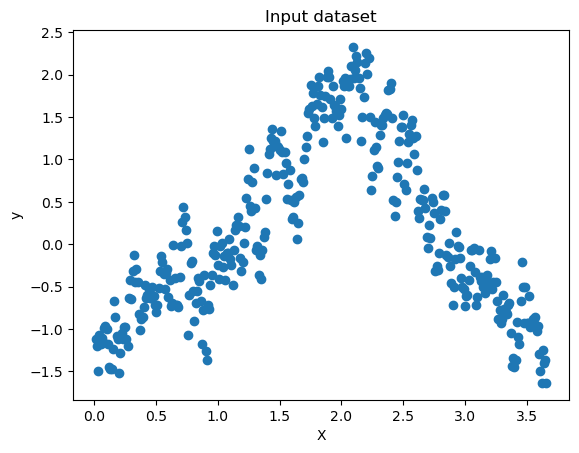

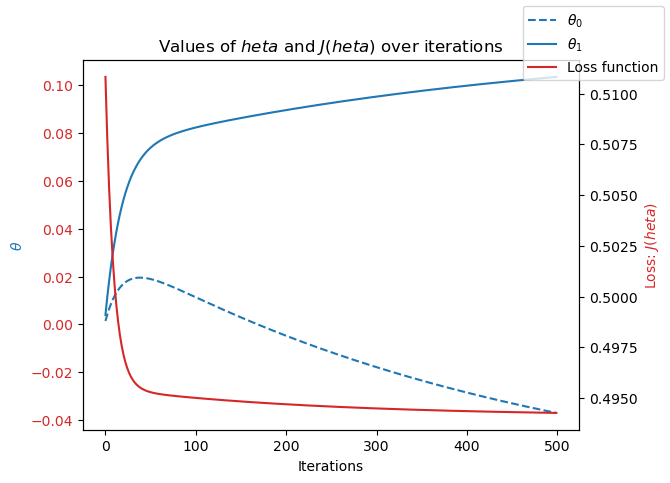

In [279]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label=r'$\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label=r'$\theta_{1}$', linestyle='-', color=color)
ax1.set_xlabel('Iterations')
ax1.set_ylabel(r'$\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\theta$ and $J(\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

fig.legend()
plt.show()

In [281]:
# This figure shows the loss function.
# X = Theta0
# Y = Theta1
# Z = Loss
# Find where it is closest to 0 in X and Y!

# Create the surface plot
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])

# Update layout
fig.update_layout(
    title='Loss function for different thetas',
    autosize=True,
    width=600,
    height=600,
    scene=dict(
        xaxis_title='theta0',
        yaxis_title='theta1',
        zaxis_title='Loss'
    )
)

# Show the plot
fig.show()

In [283]:
### 3. look at temperature data for one of the weather stations (VALENTIA)
dfv = df[['DATE', 'MONTH','VALENTIA_cloud_cover','VALENTIA_humidity','VALENTIA_pressure',
    'VALENTIA_global_radiation','VALENTIA_precipitation','VALENTIA_snow_depth','VALENTIA_sunshine',
    'VALENTIA_sunshine', 'VALENTIA_temp_mean', 'VALENTIA_temp_min','VALENTIA_temp_max']].copy()

In [285]:
dfv.head()

,DATE,MONTH,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,0.372147,-0.668215,-0.519743,-0.752237
1,19600102,1,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.829285,-0.548046,-0.629054,-0.407141
2,19600103,1,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-1.009500,-0.067372,0.054135,-0.177078
3,19600104,1,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-1.039536,-0.998679,-0.164486,-0.838511
4,19600105,1,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,0.672505,-1.509396,-1.339569,-1.471186


In [287]:
# Reduce dataset to a single year (1962)
#Assuming 'DATE' is in a recognizable date format
dfv1962 = dfv[dfv['DATE'].astype(str).str.contains('1962')]
dfv1962

,DATE,MONTH,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
731,19620101,1,-2.897272,-0.081896,0.583340,-0.747520,-0.490810,-0.024706,0.732577,0.732577,-2.530829,-2.705946,-1.988830
732,19620102,1,-3.510664,-0.363113,1.142672,-0.653268,-0.490810,-0.024706,0.882756,0.882756,-3.311925,-3.525772,-2.650263
733,19620103,1,-1.670486,-0.081896,1.273183,-1.018492,-0.490810,-0.024706,-0.408784,-0.408784,-3.161715,-3.553099,-2.333925
734,19620104,1,-1.057093,-0.081896,1.282505,-0.782864,-0.490810,-0.024706,-0.048354,-0.048354,-2.320534,-3.088531,-1.643734
735,19620105,1,1.396477,0.199321,0.592662,-1.183432,-0.052901,-0.024706,-1.039536,-1.039536,-1.929986,-2.760601,-0.752237
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,19621227,12,-2.897272,-1.628588,-0.031925,-0.771082,-0.490810,-0.024706,0.762612,0.762612,-2.921377,-2.378015,-3.110390
1092,19621228,12,-2.897272,-0.363113,-0.376846,-0.771082,-0.490810,-0.024706,0.852720,0.852720,-2.951420,-2.432670,-3.110390
1093,19621229,12,-2.283879,-1.347371,-1.038722,-1.124525,-0.490810,-0.024706,-0.739178,-0.739178,-3.191757,-2.623963,-3.570518
1094,19621230,12,1.396477,-0.503721,-1.374321,-1.195214,0.065452,-0.024706,-1.039536,-1.039536,-2.771167,-2.459998,-3.311696


In [288]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notedfv1962 = dfv1962.drop(['DATE','MONTH'], axis=1)

In [289]:
#Plot ALL weather data for all stations for a year
#X = weather station
#Y = day of the year
#Z = temperature
#you can click/hold in the graph below to rotate!
fig = go.Figure(data=[go.Surface(z=notedfv1962.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
width=600, height=600)
fig.show()

In [290]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)\n",
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data=i, columns=['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [295]:
n_rowsvale1962 = notedfv1962.shape[0]
n_rowsvale1962

365

In [297]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rowsvale1962,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsvale1962,1))
X = np.concatenate((ones, X), axis=1)
y=notedfv1962['VALENTIA_temp_mean'].to_numpy().reshape(n_rowsvale1962,1) #<----INSERT WEATHER STATION HERE

In [299]:
X.shape, y.shape

((365, 2), (365, 1))

In [301]:
#Look at one year of temperature data over time\n",
plt.scatter(x=index['index'], y=notedfv1962['VALENTIA_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [303]:
#what is the min temperature? (Note gradient descent is not actually finding this number)\n",
notedfv1962['VALENTIA_temp_mean'].min()

-3.3119254845581936

In [305]:
#what is the max temperature? (Note gradient descent is not actually finding this number)\n",
notedfv1962['VALENTIA_temp_mean'].max()

1.8853690327868504

In [307]:
# This computes the loss function for gradient descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0], [0]])):

    """

    Given covariate matrix X, prediction results y, and coefficients theta,

    compute the loss (mean squared error).

    """

    m = len(y)  # Number of samples

    theta = theta.reshape(2, 1)  # Reshape theta to ensure correct matrix dimensions

    h_x = np.dot(X, theta)  # Calculate the hypothesis (y_hat)

   

    # Calculate the error term by subtracting y from y_hat, squaring and summing

    error_term = np.sum((h_x - y) ** 2)

   

    # Divide by twice the number of samples - standard practice in cost calculation

    loss = error_term / (2 * m)

   

    return loss

In [309]:
compute_cost(X,y)

0.6262272442794531

In [311]:
def gradient_descent(X, y, theta=np.array([[0.0],[0.0]], dtype=np.float64), alpha=0.01, num_iterations=1500):
    m = len(y)
    J_history = []
    theta0_history = []  # To track theta0 values
    theta1_history = []  # To track theta1 values
    
    theta = theta.astype(np.float64)  # Ensure theta is float

    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)  # Error vector

        # Update theta using vectorized operations
        theta -= (alpha / m) * np.dot(X.T, error)  # X.T is the transpose of X

        # Store history values
        J_history.append(compute_cost(X, y, theta))
        theta0_history.append(theta[0, 0])  # Store theta0 value
        theta1_history.append(theta[1, 0])  # Store theta1 value

    return theta, J_history, theta0_history, theta1_history  # Return all four values

In [313]:
# This runs your data through a gradient descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations = 500  # Decide how many iterations you need
theta_init = np.array([[0], [0]])  # Initial guess for [theta0], [theta1]
alpha = 0.01  # Step size

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

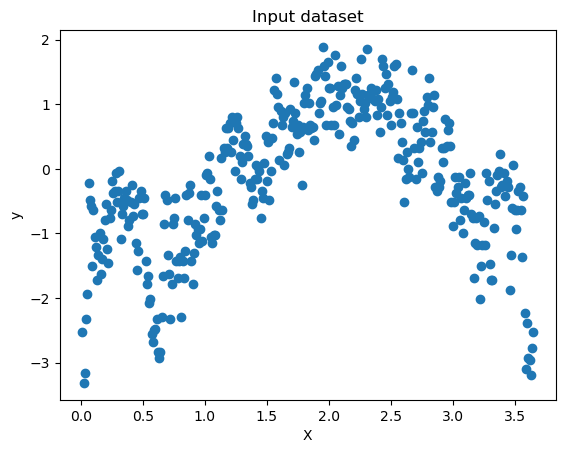

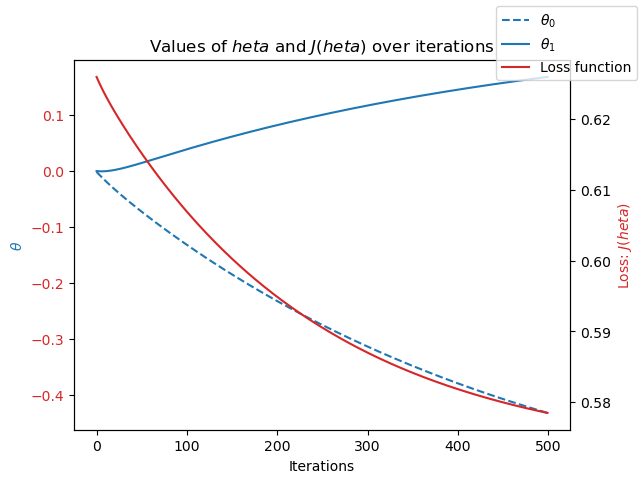

In [315]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label=r'$\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label=r'$\theta_{1}$', linestyle='-', color=color)
ax1.set_xlabel('Iterations')
ax1.set_ylabel(r'$\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\theta$ and $J(\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

fig.legend()
plt.show()

In [317]:
# This figure shows the loss function.
# X = Theta0
# Y = Theta1
# Z = Loss
# Find where it is closest to 0 in X and Y!

# Create the surface plot
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])

# Update layout
fig.update_layout(
    title='Loss function for different thetas',
    autosize=True,
    width=600,
    height=600,
    scene=dict(
        xaxis_title='theta0',
        yaxis_title='theta1',
        zaxis_title='Loss'
    )
)

# Show the plot
fig.show()

In [319]:
# Creating another dataset for a different year (year 1982)
#Assuming 'DATE' is in a recognizable date format
dfv1982 = dfv[dfv['DATE'].astype(str).str.contains('1982')]
dfv1982

,DATE,MONTH,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
8036,19820101,1,-0.443701,-0.503721,-1.383643,-1.112744,1.391014,-0.024706,-0.739178,-0.739178,-1.148890,-1.913447,-0.982301
8037,19820102,1,1.396477,2.167838,-1.616698,-1.195214,2.053795,-0.024706,-1.039536,-1.039536,-1.148890,-1.886120,-0.148320
8038,19820103,1,1.396477,1.605405,-2.194675,-1.183432,0.609880,-0.024706,-1.039536,-1.039536,0.142923,0.737323,-0.349625
8039,19820104,1,-0.443701,0.902363,-1.793820,-1.065618,0.574374,-0.024706,-0.558963,-0.558963,-0.097414,0.354738,-0.550931
8040,19820105,1,0.169692,1.183580,-1.215844,-1.077399,0.041782,-0.024706,-0.919393,-0.919393,-0.457920,0.108790,-0.867269
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8396,19821227,12,-1.057093,-0.363113,1.161316,-0.983148,-0.490810,-0.024706,-0.558963,-0.558963,-0.788384,-0.219141,-1.269880
8397,19821228,12,0.783085,1.886622,1.487593,-1.195214,0.124629,-0.024706,-1.039536,-1.039536,-1.088805,-1.366897,-0.665963
8398,19821229,12,0.783085,1.042971,1.170638,-1.183432,0.467855,-0.024706,-1.039536,-1.039536,-0.457920,-0.055175,-0.780995
8399,19821230,12,0.169692,1.746013,1.161316,-1.195214,-0.017395,-0.024706,-1.039536,-1.039536,-0.277667,0.272755,-0.780995


In [321]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notedfv1982 = dfv1982.drop(['DATE','MONTH'], axis=1)

In [323]:
#Plot ALL weather data for all stations for a year
#X = weather station
#Y = day of the year
#Z = temperature
#you can click/hold in the graph below to rotate!
fig = go.Figure(data=[go.Surface(z=notedfv1982.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
width=600, height=600)
fig.show()

In [325]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)\n",
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data=i, columns=['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [327]:
n_rowsvale1982 = notedfv1982.shape[0]
n_rowsvale1982

365

In [329]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rowsvale1982,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsvale1982,1))
X = np.concatenate((ones, X), axis=1)
y=notedfv1982['VALENTIA_temp_mean'].to_numpy().reshape(n_rowsvale1982,1) #<----INSERT WEATHER STATION HERE

In [331]:
X.shape, y.shape

((365, 2), (365, 1))

In [333]:
#Look at one year of temperature data over time\n",
plt.scatter(x=index['index'], y=notedfv1982['VALENTIA_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [335]:
#what is the min temperature? (Note gradient descent is not actually finding this number)\n",
notedfv1982['VALENTIA_temp_mean'].min()

-2.9514195064764563

In [337]:
#what is the max temperature? (Note gradient descent is not actually finding this number)\n",
notedfv1982['VALENTIA_temp_mean'].max()

2.696507483470759

In [339]:
# This computes the loss function for gradient descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0], [0]])):

    """

    Given covariate matrix X, prediction results y, and coefficients theta,

    compute the loss (mean squared error).

    """

    m = len(y)  # Number of samples

    theta = theta.reshape(2, 1)  # Reshape theta to ensure correct matrix dimensions

    h_x = np.dot(X, theta)  # Calculate the hypothesis (y_hat)

   

    # Calculate the error term by subtracting y from y_hat, squaring and summing

    error_term = np.sum((h_x - y) ** 2)

   

    # Divide by twice the number of samples - standard practice in cost calculation

    loss = error_term / (2 * m)

   

    return loss

In [341]:
compute_cost(X,y)

0.6188587980722756

In [343]:
def gradient_descent(X, y, theta=np.array([[0.0],[0.0]], dtype=np.float64), alpha=0.01, num_iterations=1500):
    m = len(y)
    J_history = []
    theta0_history = []  # To track theta0 values
    theta1_history = []  # To track theta1 values
    
    theta = theta.astype(np.float64)  # Ensure theta is float

    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)  # Error vector

        # Update theta using vectorized operations
        theta -= (alpha / m) * np.dot(X.T, error)  # X.T is the transpose of X

        # Store history values
        J_history.append(compute_cost(X, y, theta))
        theta0_history.append(theta[0, 0])  # Store theta0 value
        theta1_history.append(theta[1, 0])  # Store theta1 value

    return theta, J_history, theta0_history, theta1_history  # Return all four values

In [345]:
# This runs your data through a gradient descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations = 500  # Decide how many iterations you need
theta_init = np.array([[0], [0]])  # Initial guess for [theta0], [theta1]
alpha = 0.01  # Step size

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

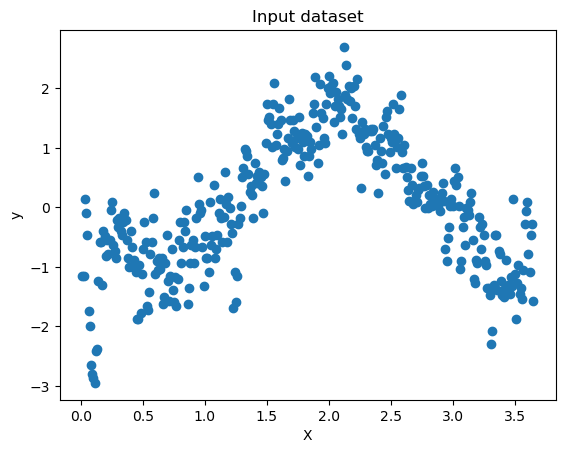

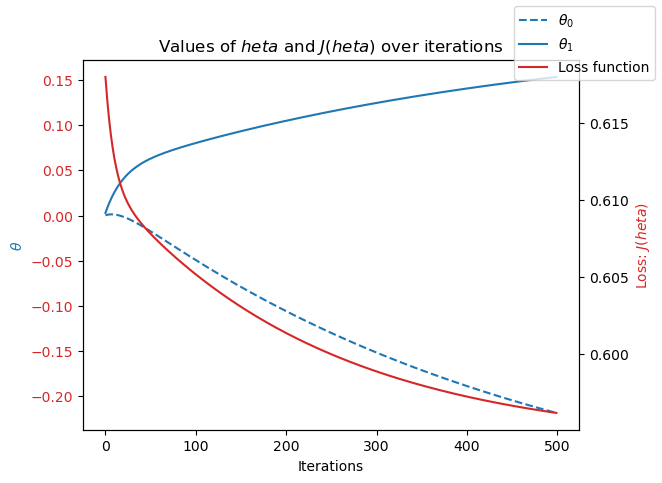

In [347]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label=r'$\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label=r'$\theta_{1}$', linestyle='-', color=color)
ax1.set_xlabel('Iterations')
ax1.set_ylabel(r'$\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\theta$ and $J(\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

fig.legend()
plt.show()

In [349]:
# This figure shows the loss function.
# X = Theta0
# Y = Theta1
# Z = Loss
# Find where it is closest to 0 in X and Y!

# Create the surface plot
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])

# Update layout
fig.update_layout(
    title='Loss function for different thetas',
    autosize=True,
    width=600,
    height=600,
    scene=dict(
        xaxis_title='theta0',
        yaxis_title='theta1',
        zaxis_title='Loss'
    )
)

# Show the plot
fig.show()

In [351]:
# Reduc dataset to a single year (2005)
#Assuming 'DATE' is in a recognizable date format
dfv1993 = dfv[dfv['DATE'].astype(str).str.contains('1993')]
dfv1993

,DATE,MONTH,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
12054,19930101,1,0.783085,0.902363,0.956228,-1.195214,-0.407962,-0.024706,-1.039536,-1.039536,-0.698257,-0.574398,-0.752237
12055,19930102,1,0.783085,0.621146,0.863006,-1.053837,-0.277773,-0.024706,-1.039536,-1.039536,-0.157498,0.546030,-0.838511
12056,19930103,1,0.783085,0.199321,-0.190402,-1.183432,2.882271,-0.024706,-1.039536,-1.039536,-0.247625,0.081462,-0.550931
12057,19930104,1,0.169692,0.058712,-0.003958,-1.136306,2.302338,-0.024706,-1.039536,-1.039536,-0.337751,-0.383106,-0.234594
12058,19930105,1,0.783085,0.199321,0.042653,-1.171651,-0.088407,-0.024706,-1.039536,-1.039536,-0.728299,-0.301123,-0.263352
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12414,19931227,12,0.783085,0.621146,-0.470068,-1.124525,2.349679,-0.024706,-0.979464,-0.979464,-1.239016,-1.585517,-0.723479
12415,19931228,12,0.783085,0.199321,-1.281099,-1.171651,0.136465,-0.024706,-1.009500,-1.009500,-1.239016,-1.585517,-0.752237
12416,19931229,12,0.169692,-1.206763,-1.728565,-0.983148,-0.265938,-0.024706,-0.468856,-0.468856,-1.058763,-0.711036,-0.665963
12417,19931230,12,0.783085,-1.206763,-1.681954,-1.042055,0.065452,-0.024706,-0.649071,-0.649071,-1.118847,-0.793019,-1.298638


In [353]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notedfv1993 = dfv1993.drop(['DATE','MONTH'], axis=1)

In [354]:
#Plot ALL weather data for all stations for a year
#X = weather station
#Y = day of the year
#Z = temperature
#you can click/hold in the graph below to rotate!
fig = go.Figure(data=[go.Surface(z=notedfv1993.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
width=600, height=600)
fig.show()

In [355]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)\n",
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data=i, columns=['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [359]:
n_rowsvale1993 = notedfv1993.shape[0]
n_rowsvale1993

365

In [361]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.
X=index.to_numpy().reshape(n_rowsvale1993,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsvale1993,1))
X = np.concatenate((ones, X), axis=1)
y=notedfv1993['VALENTIA_temp_mean'].to_numpy().reshape(n_rowsvale1993,1) #<----INSERT WEATHER STATION HERE

In [363]:
X.shape, y.shape

((365, 2), (365, 1))

In [365]:
#Look at one year of temperature data over time\n",
plt.scatter(x=index['index'], y=notedfv1993['VALENTIA_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y')
plt.title('Input dataset')

Text(0.5, 1.0, 'Input dataset')

In [367]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notedfv1993['VALENTIA_temp_mean'].min()

-2.5007870338742846

In [369]:
#what is the max temperature? (Note gradient descent is not actually finding this number)\n",
notedfv1993['VALENTIA_temp_mean'].max()

2.155748516348153

In [371]:
# This computes the loss function for gradient descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0], [0]])):

    """

    Given covariate matrix X, prediction results y, and coefficients theta,

    compute the loss (mean squared error).

    """

    m = len(y)  # Number of samples

    theta = theta.reshape(2, 1)  # Reshape theta to ensure correct matrix dimensions

    h_x = np.dot(X, theta)  # Calculate the hypothesis (y_hat)

   

    # Calculate the error term by subtracting y from y_hat, squaring and summing

    error_term = np.sum((h_x - y) ** 2)

   

    # Divide by twice the number of samples - standard practice in cost calculation

    loss = error_term / (2 * m)

   

    return loss

In [373]:
compute_cost(X,y)

0.4454222237376282

In [375]:
def gradient_descent(X, y, theta=np.array([[0.0],[0.0]], dtype=np.float64), alpha=0.01, num_iterations=1500):
    m = len(y)
    J_history = []
    theta0_history = []  # To track theta0 values
    theta1_history = []  # To track theta1 values
    
    theta = theta.astype(np.float64)  # Ensure theta is float

    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)  # Error vector

        # Update theta using vectorized operations
        theta -= (alpha / m) * np.dot(X.T, error)  # X.T is the transpose of X

        # Store history values
        J_history.append(compute_cost(X, y, theta))
        theta0_history.append(theta[0, 0])  # Store theta0 value
        theta1_history.append(theta[1, 0])  # Store theta1 value

    return theta, J_history, theta0_history, theta1_history  # Return all four values

In [377]:
# This runs your data through a gradient descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations = 500  # Decide how many iterations you need
theta_init = np.array([[0], [0]])  # Initial guess for [theta0], [theta1]
alpha = 0.01  # Step size

# Run gradient descent
theta, J_history, theta0_history, theta1_history = gradient_descent(X, y, theta_init, alpha, num_iterations)

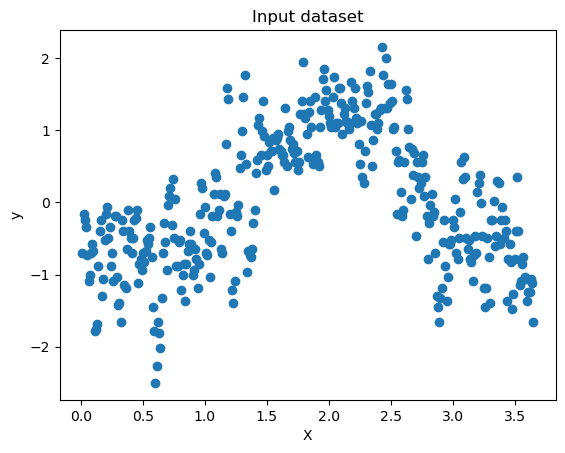

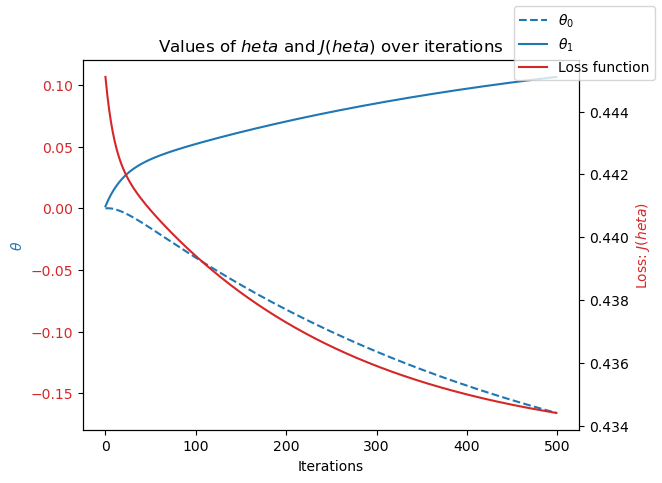

In [379]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color = 'tab:blue'
ax1.plot(theta0_history, label=r'$\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label=r'$\theta_{1}$', linestyle='-', color=color)
ax1.set_xlabel('Iterations')
ax1.set_ylabel(r'$\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color = 'tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\theta$ and $J(\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

fig.legend()
plt.show()

In [381]:
# This figure shows the loss function.
# X = Theta0
# Y = Theta1
# Z = Loss
# Find where it is closest to 0 in X and Y!

# Create the surface plot
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])

# Update layout
fig.update_layout(
    title='Loss function for different thetas',
    autosize=True,
    width=600,
    height=600,
    scene=dict(
        xaxis_title='theta0',
        yaxis_title='theta1',
        zaxis_title='Loss'
    )
)

# Show the plot
fig.show()